In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as mpatches
import seaborn as sns
from itertools import product
import requests
import gzip
import re

# nlp libraries
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
import spacy
from langdetect import detect
from spacy.lang.en.stop_words import STOP_WORDS as en_stop
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.cluster import KMeans
import scipy

# libraries for clustering
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster

# additional libraries
from PIL import Image
from matplotlib.colors import ListedColormap

import warnings
warnings.filterwarnings('ignore')

In [6]:
def bill_labelling_and_exploding(df):
    """Labels each bill as `passed` or `not passed` and `explodes` all
    rows resulting into a list of bills tagged to a single representative."""
    # label bills
    prox = df.copy().fillna('0')
    conditions = [((prox['mother_bill_status'].str.strip().str.startswith(
                      'Republic Act')) |
                  (prox['status'].str.strip().str.startswith(
                      'Republic Act')))]
    choices = ['passed']
    prox['pass_or_not'] = np.select(conditions, choices, default='not passed')
    df['passed_or_not'] = prox['pass_or_not']

    # drop duplicate titles
    df = df.drop_duplicates(subset=['title'])

    # add `;` to single authors
    m = df['principal_authors'].str.count(';') ==  0
    df.loc[m, 'principal_authors'] = df['principal_authors'][m].values + ';'

    # count total authors by counting `;`
    df['total_principal_authors'] = df['principal_authors'].str.count(';')

    # one bill per author
    df1 = df.applymap(lambda x: x.split(';') if isinstance (x, str) else [x])
    df2 = pd.DataFrame([j for i in df1.values for j in product(*i)],
                       columns=df.columns)

    # clean and save into df2
    df2 = df2[df2['principal_authors'] != '']
    df2 = df2[df2['principal_authors'] != ' ']
    return df2.reset_index().drop('index', axis=1)


def count_top20_passed(df):
    """Gets the % of bills that passed into law and bills that were filed.
    Returns only the top 20."""
    count_passed = pd.get_dummies(df,
                                  columns=['passed_or_not']).groupby(
                                  'principal_authors').sum().drop(
                                  'total_principal_authors',
                                   axis=1).drop_duplicates().reset_index()
    count_passed.columns=['principal_authors',
                          'submitted_to_hor',
                          'republic_act']
    count_passed['principal_authors'] = count_passed['principal_authors'
                                                    ].str.strip()
    count_passed['%_republic_act'] = 100*(count_passed['republic_act'] /
                                         (count_passed['republic_act'] +
                                          count_passed['submitted_to_hor']))
    count_passed['%_submitted_to_hor'] = 100 - count_passed['%_republic_act']
    
    top_20 = count_passed.nlargest(20, 'republic_act', keep='all')
    top_20 = top_20.drop_duplicates(subset=['principal_authors'],
                                    keep='first')
    top_20 = top_20.drop(['submitted_to_hor',
                          'republic_act'], axis=1)
    top_20.columns=['principal_authors',
                    '% Bills Passed into Law',
                    '% Bills Filed']
    top_20 = top_20.sort_values(by='% Bills Passed into Law')
    return top_20


def label_pandemic_era(df_eda):
    """Labels each bill depending on the date when it was filed."""
    df_eda['date_filed'] = pd.to_datetime(df_eda['date_filed'])
    df_eda['pandemic'] = np.where((df_eda['date_filed'] >= '2020-03-31'),
                                   'During Pandemic', 'Before Pandemic')
    df_significance = df_eda.copy()
    df_date = df_eda.set_index('date_filed', inplace = True)
    df_date = df_eda.resample('1M').count()['house_bill_number']
    df_date = pd.DataFrame(df_date).reset_index()
    df_date['pandemic'] = np.where((df_date['date_filed'] >= '2020-03-31'),
                                  'During Pandemic', 'Before Pandemic')
    df_date['date_filed'] = df_date['date_filed'].dt.strftime('%Y-%m')
    return df_significance, df_date


def tokenize(df):
    """Tokenize the text."""
    tokenizer = RegexpTokenizer(r'[^\s,\.\-\?!:;\(\)\"\"\#\$\%\&\*\/]+')
    tokenized = [" ".join(tokenizer.tokenize(df['title'].values[i].lower()))
                 for i in range(df.shape[0])]
    df['tokenized_text'] = tokenized
    return df


def remove_stopwords(df):
    """Remove stop words from the tokenized text."""
    stop_words = stopwords.words('english') + list(en_stop)
    stop_words += ["what's", "there's", 'that\'s', 'i\'m', 'pm',
                   'we\'re', 'i\'ve', 'i\'ll', 'i\'d', 'etc',  'am', 'nn',
                   'would', 'also', 'act', 'fund', 'purpose', 'establish',
                   'therefor', 'amend', 'provide', 'appropriating',
                   'otherwise', 'republic', 'philippine', 'know', 'create',
                   'institutionalize', 'section', 'institute', 'strengthen',
                   'appropriate', 'office', 'authority', 'declare',
                   'and', 'for', 'the', 'of', 'to', 'an', 'as', 'in',
                   'its', 'amended', 'known', 'from', 'on',
                   'would', 'also', 'act', 'fund', 'purpose', 'establish',
                   'therefor', 'provide', 'amend',
                   'otherwise', 'philippine', 'know', 'create',
                   'institutionalize', 'section', 'institute',
                   'strengthen', 'appropriate', 'office', 'authority',
                   'declare', 'other', 'no', 'fund therefor',
                   'appropriating fund', 'for other', 'and for',
                   'an act', 'in the', 'other purpose', 'and appropriating',
                   'act establish', 'for the', 'of the', 'as the',
                   'act provide', 'province of', 'act no', 'municipality of',
                   'therfor and', 'provide for', 'otherwise known',
                   'therefor and', 'establish the', 'and provide', 'or',
                   'the purpose', 'the national', 'to be', 'act of',
                   'be know', 'amend for', 'provide for', 'act declare',
                   "as amended", 'known as']
    stopped = ([" ".join([text for text in
                         [word for word in
                          df['tokenized_text'].values[i].split()]
                          if text not in stop_words])
                for i in range(df.shape[0])])
    df['stopped_text'] = stopped
    return df


def lemmatize(df):
    """Lemmatize the texts without stop words."""
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
    stemmed = ([" ".join([token.lemma_ for token in
                          nlp(df['stopped_text'].values[i])])
                for i in range(df.shape[0])])
    df['stemmed_text'] = stemmed
    return df


def tfidf_converter(text_array):
    """Return a tf-idf matrix from an array containing text data.

    Parameters
    ----------
    text_array : np.array
        A numpy array that represents the corpus, which would be converted
        to a tf-idf matrix.

    Returns
    -------
    tfidf : scipy.sparse.csr.csr_matrix
        A sparse matrix in compressed sparse row (CSR) format which serves as
        the tf-idf representation of the entire corpus.
    """
    corpus = [text_array[i] for i in range(text_array.shape[0])]
    vectorizer = TfidfVectorizer(lowercase=True, ngram_range=(1, 3),
                                 token_pattern=r'(?u)\b[a-z]{3,}-?\w*\b',
                                 min_df=0.001, max_df=0.8)
    tfidf = vectorizer.fit_transform(corpus)
    columns = vectorizer.get_feature_names()
    return tfidf, columns


def plot_var_explained(X, thresh):
    """Return reduced matrix and plot cumulative variance.

    Parameters
    ----------
    matrix : scipy.sparse.csr.csr_matrix
        The matrix that would be transformed via singular value decomposition.

    Returns
    -------
    X_new : np.array
        The transformed data matrix after applying truncated singular
        value decomposition to the data. This is the resulting dimensionality
        reduction after singular value decomposition.
    """
    svd_test = TruncatedSVD(n_components=X.shape[1]-1)
    tfidf_new_test = svd_test.fit_transform(X)
    optimal_svs = np.where(svd_test
                           .explained_variance_ratio_
                           .cumsum() >= thresh)[0][0] + 1
    plt.figure(figsize=(13, 8))
    plt.plot(svd_test.explained_variance_ratio_.cumsum())
    plt.axhline(thresh, color='red', ls='--')
    plt.axvline(optimal_svs, color='red', ls='--')
    plt.annotate(f'n = {optimal_svs}', xy=(optimal_svs+0.5, 0.9),
                 weight='bold', size=10)
    return tfidf_new_test


def bill_labelling(df):
    """Add whether a bill is passed."""
    prox = df.copy().fillna('0')
    prox
    conditions = [
        ((prox['mother_bill_'
               'status'].str.strip().str.startswith('Republic Act')) |
        (prox['status'].str.strip().str.startswith('Republic Act')))
    ]
    choices = ['passed']
    prox['pass_or_not'] = np.select(conditions, choices, default='not passed')

    prox[prox.mother_bill_status.str.startswith('Republic Act')]
    return prox['pass_or_not']


def cleaned_titles(df):
    """Tokenize, remove stop words, and stem text contents of dataframe"""
    df_tokenized_p = tokenize(df)
    df_tokenized_p

    df_stopped_p = remove_stopwords(df_tokenized_p)
    df_stopped_p

    df_stemmed_p = lemmatize(df_stopped_p)

    return df_stemmed_p


def plot_dendrogram(X_transformed, p, method='ward', tr_mode='level',
                    show=True, thresh=None):
    """Plot the dedrogram of transformed tfidf matrix"""
    from scipy.cluster.hierarchy import linkage, dendrogram
    Z = linkage(X_transformed, method=method)
    dn = dendrogram(Z, truncate_mode=tr_mode, p=p)
    plt.close()
    
    d_t_values = []
    for i in range(len(dn['dcoord'])+1):
        if i != (len(dn['dcoord'])):
            d_t_values.append(dn['dcoord'][i][1] - dn['dcoord'][i][0])
        else: 
            break

    best_t = dn['dcoord'][d_t_values.index(max(d_t_values))][0]
    max_delta = (dn['dcoord'][d_t_values.index(max(d_t_values))][1]
           - dn['dcoord'][d_t_values.index(max(d_t_values))][0])
    mid = max_delta/2
    
    if thresh == None:
        thresh = best_t + mid # optimal cut
    
    fig, ax = plt.subplots(figsize=(12,4), dpi=300)
    ax.axhline(thresh, ls='--', color='black')
    
    dn = dendrogram(Z, truncate_mode=tr_mode, p=p, color_threshold=thresh,
                    ax=ax)
    if show:
        plt.show()
    else:
        plt.close()
    return thresh


def plot_fcluster(X_transformed, thresh, x_axis, y_axis, title,
                  method='ward', criterion='distance', show=True):
    """Plot flat cluster of transformed tfidf matrix"""
    from scipy.cluster.hierarchy import fcluster
    from scipy.cluster.hierarchy import linkage
    Z = linkage(X_transformed, method=method)
   

    y_predict_pass = fcluster(Z, t=thresh, criterion='distance')
    plt.scatter(X_transformed[:, x_axis], X_transformed[:, y_axis],
                c=y_predict_pass)
    plt.xlabel(f'SV{x_axis+1}')
    plt.ylabel(f'SV{y_axis+1}')
    plt.title(title)
    if show:
        plt.show()
    else:
        plt.close()
    return y_predict_pass


def transform_format(val):
    """Replace 255 values to true in array"""
    if val == True:
        return 255
    else:
        return val


def wordcloud_plotting(tfidf_score, cmap, title, mask, c_color='white',
                       bg='#235578'):
    """Visualize a wordcloud from the tfidf matrix."""
    wordcloud = WordCloud(max_words=180, background_color=bg,
                          relative_scaling=0.5, colormap=cmap, width=1600,
                          height=1600, mask=mask, contour_width=0.1,
                          contour_color=c_color)
    wordcloud.generate_from_frequencies(tfidf_score)
    fig = plt.figure(figsize=(10,10), dpi=300)
    fig = plt.axis('off')
    fig = plt.imshow(wordcloud)
    fig = plt.title(title, fontsize=14)
    fig = plt.show()
    return fig

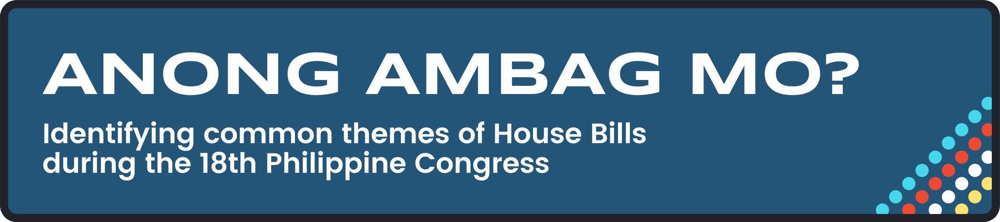

<center>by <b>Kashmirr Camacho, Kristine Ann Carandang, Weddy Anne Diamada, <br> John Francis Gacal, Manuel John Paul Gaspar, and Joaquin Emmanuel Gonzales</b></center>
<center>Data Mining and Wrangling | MSDS 2022 | Asian Institute of Management</center>
<center>Submitted 16 September 2021</center>

# Executive Summary

**Background**<br>
House Representatives *represent* each one of us. This enables Filipinos to contribute to lawmaking through their district representatives, who continue to write more bills than ever. However, only four out of 100 House bills survive to become laws. Shifting priorities amidst the dynamic political climate make lawmaking complex to understand and follow through. Identifying the common themes of House bills may provide an understanding of the Congressional priorities and improve and increase citizen participation. **This report aims to contribute in existing research related by identifying common themes of House bills during the 18th Congress**.

**Methods**<br>
In this report, we scraped data from the House of Representatives website to extract all bills and its features from 01 July 2019 to 30 August 2021. We pre-processed the data to tokenize, lemmatize, remove stop words using `RegexpTokenizer` and `Spacy` libraries, and then constructed a TF-IDF matrix. We then performed dimensionality reduction using Latent Semantic Analysis to truncate the data that would be used for clustering analysis using 90% cumulative variance as threshold. Agglomerative clustering was used to determine and surface the clusters and themes from more than the 9000 documents that we scraped. 

**Results**<br>
We have observed different clusters that may help us understand Congressional priorities. Our results suggest that:
1. **Most bills that are filed relate to Constitutional mandates that require Congressional action**. This includes the establishment of new schools, roads, or courts. 
2. **The rest of the emerging clusters relate to the President's key priorities**. This supports the view that it is the President who sets the agenda for Congress, despite them being of co-equal branches. 
3. Finally, **the case of ABS-CBN is a tangible example of the conflict between Congress' Constitutional mandate and the President's priorities**. Congress has continued to review and approve broadcasting and network franchises even during the pandemic, yet it has never reviewed nor passed any measures that relate to ABS-CBN's franchise.

**Conclusion and Recommendations**<br>
We have observed that bills filed under the House of Representatives relate to their compliance for Constitional mandates. Those that continue to pass into law relate to the President's key priorities, as set out during the annual SONA. We have observed no clusters that opposed any of Congress' co-equal branches - that of the President's or the Judiciary's priorities or sentiments - which may indicate respect and courtesy for the separation of powers. An extension of this study may be done by considering more features and understanding further the dynamics that are at play during lawmaking: for example, there may be clusters that emerge from specific parties, party lists, or dynasties.

# Introduction

The lawmaking process is complex and expensive. There are many relationships at play all throughout a bill’s lifetime, whether or not the ultimate outcome is survival (i.e. a bill becomes a law) or death (i.e. a bill does not become law). Congresspeople are placed into power by voters in each of their districts to pass laws on their behalf, as demonstrated by the Philippines’ representative democracy modeled after the US system ([US Department of State, 2017](#us)). Below, we provide context on the role of lawmakers and how it is influenced by other stakeholders to pivot from or influence lawmaking.

## History

The House of Representatives (and Senate) trace its roots back to the Jones Law of 1916 (Philippine Autonomy Act), which created the bicameral legislature reminiscent of American Congress. Members of the House are elected from local districts every three years. Some view this as “grossly over-represent[ing] the largest parties and excludes minor parties”, despite the introduction of proportional representation through the party-list system ([Teehankee, 2002](#teehankee); [Wurfel, 1997](#wurfel)). 

Nevertheless, the Constitution provides three main branches of government to separate powers, and implement checks and balances between the three of them. Vested in the Philippine Congress is the power to create, repeal, and amend laws, which the Executive branch should implement. The Judicial intervenes to evaluate and clarifies if other branches exceed their constitutional powers. Separation of powers, then, means to have co-equality in between branches, without one dominating any other.

Yet despite this, Filipinos view the Executive branch, headed by the President of the Philippines, as the higher authority. Some argue this is because Filipinos have been socialized through the term “Pangulo”, translated as the head and only head, of any organization or group. [Agpalo (1981)](#agpalo) has suggested that dominant chiefs persist despite the ever-changing dynamics of political history ([Panao, 2014](#panao)).

President Rodrigo Duterte, as with all Presidents that came before him, uses this to the Executive branch’s advantage. Even if he has no power to create laws by himself nor compel Congress to make them so, he takes advantage of residual and implied powers ([Rose-Ackerman, Disierto, and Volosin, 2011](#rose)). For example, [Panao (2014)](#panao) views the President’s power over budget as “not only a tool for fiscal management but a bargaining chip in legislative policy-making”. Lawmaking thus is where executive-legislative relations are made tangible: presidents set the agenda and lawmakers comply.

## Bill Creation

When democracy was restored in 1987, only 204 representatives sat at the House. This has increased to 304 representatives in the current 18th Congress, due to the creation of new districts or more seats for party list representation. All of them are responsible for the lawmaking process, mainly articulated through the following ([Official Gazette, 2021](#official)):

1. **Bills** - are drafts of the laws that Congress intends to pass. They undergo multiple debates and revisions. They are sometimes consolidated into a single bill when several, similarly-themed bills have been submitted for consideration before the Senate and House of Representatives convene for final approval. They are then submitted to the President of the Philippines, who can veto the bill or parts of it; however, the House of Representatives may overturn the veto by gathering ⅔ of the vote. <br> <br>
2. **Resolutions** - are sentiments formalized by the House through the submission of documents. They may be classified into joint, concurrent, or simple resolutions:
   - **Joint resolutions** require the approval of both the Lower and Upper House, and the signature of the President. It may have the force of law when approved.
   - **Concurrent resolutions** are administrative matters that are limited to Congress only, and so do not require the concurrence of the President.
   - **Simple resolutions** deal with a single House only: either the lower or upper House submit a resolution, usually in recognition of accomplishments made by their stakeholders within each of their districts.

Congressional priorities made on their own are not made explicit nor articulated; rather, they are crafted jointly through the Legislative-Executive Development Advisory Council (LEDAC). The President is able to promote their priority measures during the State of the Nation Address (SONA), annually held at the House of Representatives.

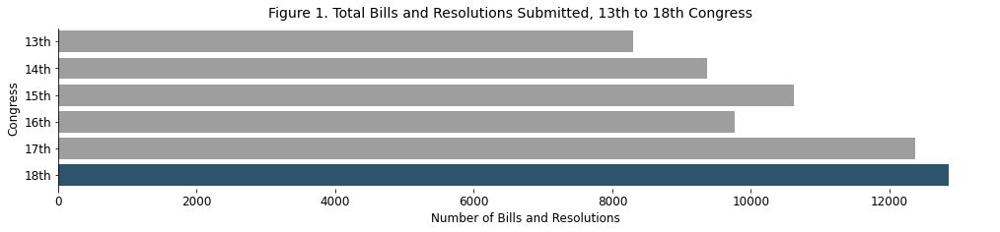

In [7]:
yearly_bills = {'Congress': ['13th', '14th', '15th', '16th', '17th', '18th'],
        'Bills': [8305, 9366, 10623, 9764, 12375, 12859]}
congress_bills = pd.DataFrame(yearly_bills)

fontsize = 12
fig, ax = plt.subplots(figsize = (17, 3))
ax = sns.barplot(y='Congress',
                 x='Bills',
                 data=congress_bills,
                 palette=['#9e9e9e' if x!='18th' else \
                          '#235578' for x in congress_bills.Congress])
ax.set_xlabel('Number of Bills and Resolutions',
              fontsize=fontsize)
ax.set_ylabel('Congress',
              fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
fig.suptitle('Figure 1. Total Bills and Resolutions Submitted, '
             '13th to 18th Congress', fontsize=fontsize+2)
plt.show()

In 2018 alone, the budget for the entire Congress was 28 billion pesos. This was lower when compared to previous years given the impact of work-from-home setups due to government restrictions related to the pandemic. Despite this, it appears that lawmakers are increasingly becoming productive. Its 82% attendance rate was recorded in the current Congress last 2019, lauded as its highest ever by state-controlled media ([Reganit, 2019](#reganit)). In fact, lawmakers are writing more bills than ever; for the current Congress alone - yet to finish in 2022 - close to 13,000 bills and resolutions have been filed (see Figure 1). While there is no limit to how many bills a lawmaker can submit for consideration, there is a limit, however, as to the number of bills the House can debate on and ratify.

## Bill Survival

Despite filing so many bills, only 11.4% of these actually survived into becoming republic acts or official laws.  While we did not dissect the entire lawmaking process, a lot of bills naturally do not survive committees, let alone for the consideration of the entire House, similar to foreign Congresses ([Yano, Smith, and Wilkerson, 2012](#yano)). 

An additional challenge is reviewing the entire decision-making process of all bills, of which there are more than 13,000 submitted. In fact, as seen in Figure 2, among the Top 20 representatives that have the highest ratio of bills-passed-into-law to bills filed, the average survival rate is 18.48%, indicated by the red line. This means that they only passed 18.48% of all the bills they write and file.

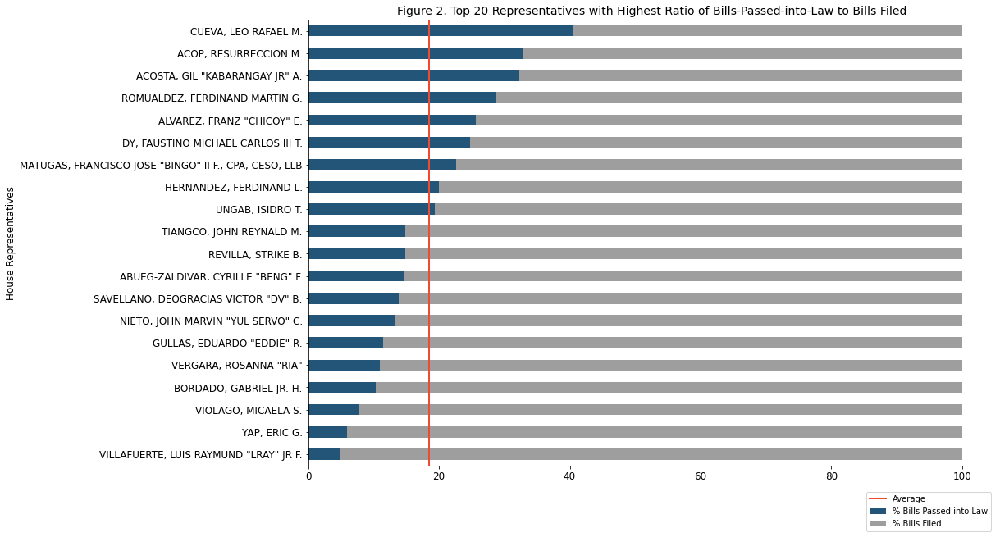

In [9]:
# open csv file of the complete dataset
df_all = pd.read_csv('hbs_old.csv')

# drop rows with duplicate titles
df = df_all.drop_duplicates(subset='title')

df_labelled = bill_labelling_and_exploding(df)
top_20 = count_top20_passed(df_labelled)
plot_labels = ['Average', '% Bills Passed into Law', '% Bills Filed']

ax = top_20.plot(kind='barh',
                 stacked=True,
                 figsize=(15, 10),
                 color=['#235578', '#9e9e9e'])
ax.set_ylabel('House Representatives', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.set_yticklabels(top_20['principal_authors'])
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.axvline(x=top_20['% Bills Passed into Law'].mean(), linewidth=2,
           color='#f04a32ff')
ax.legend(bbox_to_anchor=(1, -.05), labels=plot_labels)
plt.title('Figure 2. Top 20 Representatives with Highest Ratio of '
          'Bills-Passed-into-Law to Bills Filed', fontsize=fontsize+2)
plt.show()

Determinants of legislative success abound in academic literature; one, in particular, refers to the Presidential agenda. Bills that a Philippine President identifies as urgent during the annual SONA enjoy a higher rate of survival than those who do not, but it changes over time; interestingly, [Panao (2014)](#panao) has identified that “at some point, the President’s so-called legislative agenda actually increases non-approval”.

The peculiar treatment of authorship, on the other hand, is reminiscent of academia; the more authors one bill has, the likelier it appears to pass as law. 
<br>
<br>
<center><left><b><font size=2> Table 1. Highest number of co-authors for 18th Congress bills </font></b></left>
<br>
<font size=2><font color="gray">Data from the House of Representatives website</font></font></center>

| Title | Authors | Focus Area |
|:---|:---:|:---:|
| Bayanihan To Arise As One Act | 288 | COVID-19 |
| ARISE Philippine Act | 256 | COVID-19 |
| Creating The Department Of Disaster Resilience, Defining Its Mandate, Powers And Functions | 234 | Disaster |
| Philippine Center For Disease Prevention And Control (CDC) Act | 231 | Health |
| The Covid-19 Unemployment Reduction Economic Stimulus (CURES) Act Of 2020 | 225 | COVID-19 |
| Boracay Island Development Authority (BIDA) Act | 200 | Tourism |
| Waste Treatment Technology Act | 195 | Environment |
| New Philippine Passport Act | 178 | Foreign Affairs |
| Young Farmers And Fisherfolk Challenge Act | 156 | Agriculture |
| Non-Combustible Nicotine Delivery Systems Regulation Act | 153 | Health |

It appears then that at least for the 18th Congress, the most co-authored bills are related to COVID-19 (See Table 1). The highest alone had 288 co-authors, more than 90% of the entire House of Representatives. 

Beyond this list, however, are we able to know what are its other priorities? We use the above information as a starting point to dive deep and resurface the priorities of Philippine representatives using scraping, dimensionality reduction, and clustering.

## Significance/Motivation
Laws are based on language and text, which includes debates, priorities, and sentiments of a particular Congress. Here, we use text data to surface the priorities of the current House of Representatives in the context of the latter years of President Rodrigo Duterte and the COVID-19 pandemic. Knowing their thematic priorities can help citizens hold our representatives accountable; after all, in a representative democracy, representatives are placed into power by voters within each of their districts.

## Research Questions

This study aims to answer the main research question: **What are the common themes of House bills filed during the 18th Congress?**
- What are the common themes of **all** House Bills filed during the 18th Congress?
- What are the common themes of the House Bills that:
  - **passed** into law during the 18th Congress?
  - **did not pass** into law during the 18th Congress?
- Among House bills that became laws, what are the common themes among those that were:
  - passed **before** the COVID-19 pandemic?
  - passed **during** the COVID-19 pandemic?

## Scope and Limitations
We evaluated a few limitations of this report, and have taken steps to minimize them wherever possible:

1. **Data limitations**. This study is limited to the data available on the House of Representatives’ website only. We have not scraped contents of the House bills nor in previous Congresses in the interest of time. Analysis is thus limited to the time period covered and bill titles only, which we believe is sufficient to surface themes.
2. **Time period covered**. Data gathered covered House bills from the 18th Congress, which is currently in session. This means that more bills will have yet to be filed by congresspeople, and so the current insights may change in a few months’ time when it officially ends early next year. Additionally, we used 16 March 2020 to determine laws passed before and during the COVID-19 pandemic. This was the date when the government announced that the entire country was in a *State of Calamity* because of the pandemic.
3. **No additional verification made on the data collected**. This study did not take into account additional sources of information, such as actual and official statistics from the administrative offices of the House of Representatives. Data presented here are what was available from their website, but we do not expect any major data inaccuracies.

# Data
## Dataset Description

The House of Representatives makes the list of bills and resolutions submitted for consideration publicly available through LEGIS, a search-based system “that allows access, retrieve, or save structured bills information and status as well as download full texts of Bills, and Resolutions, its Authorship, Committee Referrals, and Nature of Bills” ([House of Representatives, 2021](#house)). Its database of documents are available from the 8th Congress up to the present.

This report is limited to bills introduced during the 18th Congress, covering submissions made between 1st July 2019 to 30th August 2021, because:
1. It contains the relevant, contextual information of a shift in priorities: between 2019 and 2022, a national emergency regarding the pandemic has been authorized by Congress
2. It is relevant in the context of accountability, given that the next elections will happen in May 2022, and so holding district representatives responsible for the bills they pass or submit is crucial

<center><left><b><font size=2> Table 2. Data Keys and Values </font></b></left>
<br>
<font size=2><font color="gray">Each of the following was scraped from the House of Representatives Website</font></font></center>

| Key | Value | Type |
|:---|:---|:---:|
| `house_bill_number` | Identifier tagged for each House bill submitted | string |
| `title` | The long title of the House bill | string |
| `significance` | Type of significance is divided into two: National and Local | string |
| `date_filed` | Date the House bill was filed | date |
| `principal_authors` | List of House bill authors | string |
| `date_read` | Date the House bill was read in a committee | date |
| `primary_referral` | Name of referring committee | string |
| `mother_bill_status` | Information on the status of the mother bill, if applicable | string |
| `status` | Status of the House bill | string |

## Summary Statistics

<center><left><b><font size=2> Table 3. Summary Statistics of the Scraped Data </font></b></left>
<br>
<font size=2><font color="gray">Each of the following was scraped from the House of Representatives Website</font></font></center>

|  | house_bill_number | title | significance | date_filed | date_read | primary_referral | mother_bill_status | status |
|---:|---:|---:|---:|---:|---:|---:|---:|---:|
| count | 10096 | 10096 | 10096 | 10096 | 10096 | 10096 | 2226 | 10096 |
| unique | 10096 | 9074 | 2 | 518 | 181 | 72 | 271 | 3813 |
| freq | 1 | 19 | 7226 | 900 | 1068 | 1126 | 104 | 104 |

All in all, we have scraped 10,096 House bills, with 9,074 unique `title`s. This may indicate that some Bill `title`s are the same, and may have been eventually consolidated together. Those that have been officially consolidated are indicated in the `mother_bill_status`. 

# Methodology

## Data Extraction and Cleaning

We started by scraping text data from the website of the House of Representatives (`https://congress.gov.ph/legisdocs/?v=bills`), using Beautiful Soup and requests. Close to 13,000 documents were publicly available as of 28 August 2021, but we only focused on bills. We intentionally excluded resolutions as they do not continue to become republic acts or laws.

In [ ]:
###############################################
# scraping the data and converting to dataframe
###############################################

# scrape the data
req = requests.get('https://congress.gov.ph/legisdocs/?v=bills')
soup = BeautifulSoup(req.text)

# get list of IDs (house bill number)
id_list = []
for id_ in (soup.find_all('div', class_='panel panel-default')[0]
            .find_all('div', class_='panel-heading')[1:]):
    id_list.append(id_.find('span').text)

# store the data in a list of lists
details = []
date_filed = []
for i,elem in enumerate(soup.find_all('div',
                                      class_='panel panel-default')[0]
                        .find_all('div',
                                  class_='panel-body')):
    details.append(elem.text)

# store details of each house bill in a dictionary
details_list = []
for i, elem in enumerate(soup
                         .find_all('div',
                                   class_='panel panel-default')[0]
                         .find_all('div', class_='panel-body')):
    entry = dict()

    for z, p_elem in enumerate(elem.find_all('p')):

        text = p_elem.text.strip()
        if text.isupper():
            entry['title'] = p_elem.text
        elif 'Significance:' in text:
            entry['significance'] = p_elem.text
        elif 'Date Filed:' in text:
            entry['date_filed'] = p_elem.text
        elif 'Date Urgent:' in text:
            pass
        elif 'Principal Author/s:' in text:
            entry['principal_authors'] = p_elem.text
        elif 'Date Read:' in text:
            entry['date_read'] = p_elem.text
        elif 'Primary Referral:' in text:
            entry['primary_referral'] = p_elem.text
        elif re.match(r'\bMother Bill Status:\b', text) is not None:
            split_bill = re.split(r'\SStatus: ', text)
            entry['mother_bill'] = split_bill[0]
            entry['mb_status'] = split_bill[1]
        elif re.match(r'\bStatus:', text) is not None:

            entry['status'] = text
        elif re.match(r'\bStatus:', text) is None:
            entry['status'] = None

        elif 'Short Title:' in text:
            pass
        else:
            break
    details_list.append(entry)

# convert dictionary to dataframe
bills = pd.DataFrame(details_list)

# remove categories from values
cols = bills.columns.tolist()
for column in cols:
    bills[column] = bills[column].str.split(': ', expand=False)
    content = []
    for i in bills[column].values.tolist():
        if isinstance(i, list):
            if len(i) == 2:
                content.append(i[1])
            else:
                content.append(i[0])
        else:
            content.append(i)
    bills[column] = content

# input correct titles
titles = []
for i in range(len(details)):
    start = details[i].rfind('\xa0') + len('\xa0')
    stop = details[i].find('Significance')
    titles.append(details[i][start:stop])
bills['title'] = titles

# delete short title from title if existing
content = []
for i in bills.title.values.tolist():
    if i.find('Short Title') != -1:
        content.append(i.split('Short Title: ')[0])
    else:
        content.append(i)
bills['title'] = content

# input mother bill status & status
mb = []
st = []
for i in range(len(details)):
    if details[i].find('Mother Bill Status:') != -1:
        start = (details[i].find('Mother Bill Status:')
                 + len('Mother Bill Status: '))
        mid = details[i].find('Status:') + len('Status:')
        stop = mid + details[i][mid:].find('Status')
        mb.append(details[i][start:stop])
        st.append(details[i][mid + details[i][mid:]
                             .find('Status') + len('Status: '):])
    else:
        mb.append(None)
        st.append(details[i][details[i].find('Status') + len('Status: '):])
bills['mother_bill_status'] = mb
bills['status'] = st
bills['status'] = bills['status'].replace({'': None})

# add house bill numbers
bills['house_bill_number'] = pd.Series(id_list)[bills.index]
bills = bills[[bills.columns[-1]] + bills.columns[:-1].to_list()]

# re-order columns
bills = bills[['house_bill_number', 'title', 'significance',
               'date_filed', 'principal_authors', 'date_read',
               'primary_referral', 'mother_bill_status', 'status']]

# drop rows with NaN values in the given columns
# rows with NaN values under `mother_bill_status` were retained
cols_nan = ['date_filed', 'date_read', 'primary_referral', 'status']
bills_ = bills.dropna(subset=cols_nan, axis=0)

# extract rows that are house bills
hb = bills_['house_bill_number'].str.extract(r'(HB\d+)').dropna()[0].tolist()
hbs = bills_[bills_['house_bill_number'].isin(hb)]

# further cleaning - drop row containing empty string
hbs['title'].str.extract(r'(FREE PROFESSIONAL EXAMINATIONS)').dropna()
hbs['title'][9287]
hbs = hbs.drop(index=9287, axis=0)

# save to a csv file
# hbs.to_csv('hbs.csv', index=None)

For the analysis of themes of the bills, only the titles were used for the study. Bills in the House of Representatives have what we call as “mother bills” - which are the consolidated form of many other bills that are similar in nature - and there were also the same bills filed by different congresspeople so our workable data set totals to 9,142 bills. We then saved it in a data table and dropped duplicates before cleaning of text data was done. 

In [13]:
# open csv file of the complete dataset
df_all = pd.read_csv('hbs_old.csv')

# drop rows with duplicate titles
df = df_all.drop_duplicates(subset='title')

## Dimensionality Reduction and Clustering

We performed the following methods to extract themes of clusters for:
1. all the house bills filed;
2. a comparison of bills that were not passed into law and those that were passed into law; and
3. a comparison of bills that were passed into law before the COVID-19 pandemic and those that were passed during the pandemic.

***Tokenizing the Text Data***

Before performing dimensionality reduction, the text data under the `title` column was tokenized. To facilitate a simpler analysis, all punctuations and numbers from the text reviews were first removed before tokenizing. Each word represents a sequence of alphanumeric characters, including some punctuations such as dashes and dollar signs. Words in each review are delimited by a whitespace. The text was tokenized using the `RegexpTokenizer` of `SciKit-Learn`.

Lemmatization was then performed in order to ensure that inflected words are changed to their base form using the Spacy lemmatizer. The `Spacy` lemmatizer was used as this library takes into account the Part-of-Speech (POS) tagging of each token before truncating the word in its base form. Hence, words such as writing are converted to the correct root word write (which NLTK-based stemmers could not do with high accuracy).

***Constructing the TF-IDF Matrix***

Since using term frequencies as a way to rank all the words in the corpus tend to generate top words that lack contextual information, the study uses the sum of the TF-IDF scores for each unique word in all of the documents in the corpus as a metric to rank the most important words that appear in the `title` of the house bills. To also consider the relationships of words specifically of two and three words, the lower and upper boundary of the range of the n-grams were specified as (1,3).

***Dimensionality Reduction and Clustering***

We then performed dimensionality reduction using Latent Semantic Analysis to truncate the data that would be used for clustering analysis. 90% cumulative variance was used as threshold.

Finally, we did agglomerative clustering to determine the clusters. Clustering allows us to make common and underlying themes emerge from more than 9000 documents that we scraped. We then presented what we labelled them according to the themes that emerged after clustering.

# Exploratory Data Analysis

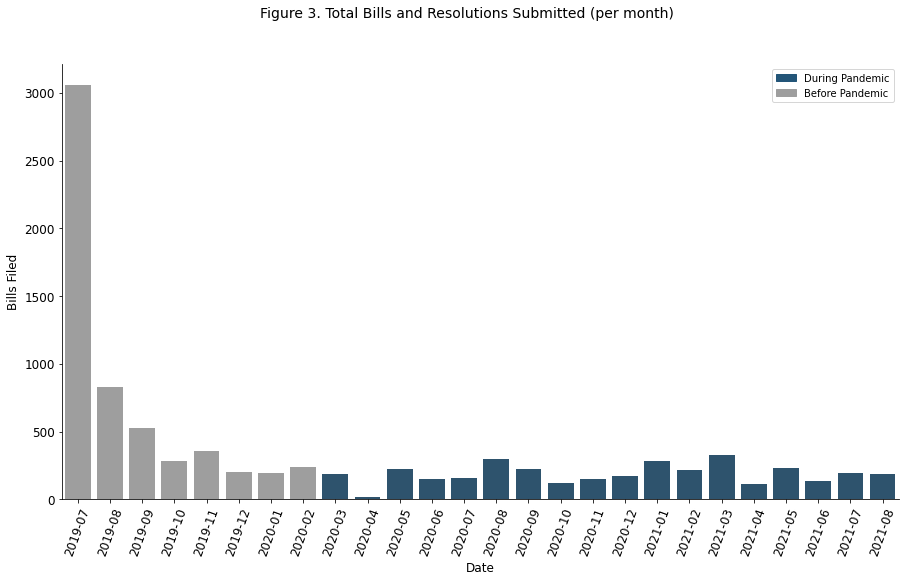

In [14]:
pd.options.mode.chained_assignment = None 

df_significance, df_date = label_pandemic_era(df)
fontsize = 12
fig, ax = plt.subplots(figsize = (15, 8))
ax = sns.barplot(y='house_bill_number',
                 x='date_filed',
                 data=df_date, 
                 palette=['#9e9e9e' if x!='During Pandemic' else \
                 '#235578' for x in df_date.pandemic])
ax.set_xlabel('Date', fontsize=fontsize)
ax.set_ylabel('Bills Filed', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
fig.suptitle('Figure 3. Total Bills and Resolutions Submitted (per month)',
             fontsize=fontsize+2)
plt.legend(handles=[mpatches.Patch(color='#235578', label='During Pandemic'),
                    mpatches.Patch(color='#9e9e9e', label='Before Pandemic')])
plt.xticks(rotation=70)
plt.show()

Much of the bills and resolutions were submitted before the pandemic, but only because most documents are submitted during the start of the current Congress session. As seen in Figure 3, bills and resolutions have continued to be filed for consideration, the lowest being April 2020 during the early days of the lockdowns in Congress. While it may appear that the House was business-as-usual, we have observed an actual shift in focus before and during the pandemic.

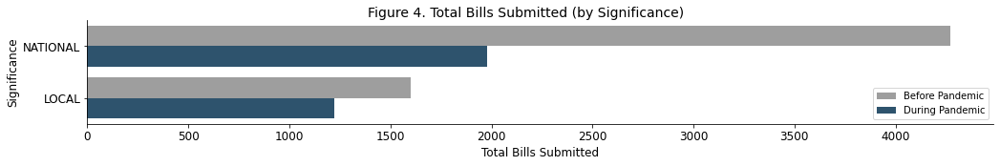

In [15]:
fig, ax = plt.subplots(figsize = (17, 2))
palette ={"During Pandemic": "#235578", "Before Pandemic": "#9e9e9e"}
ax = sns.countplot(y='significance', data=df_significance, hue='pandemic', 
                   palette=palette)
ax.set_xlabel('Total Bills Submitted',
              fontsize=fontsize)
ax.set_ylabel('Significance',
              fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=labels)
fig.suptitle('Figure 4. Total Bills Submitted (by Significance)',
             fontsize=fontsize+2)
plt.show()

Bills can also classified according to its Significance, depending if it is of `Local` or `National` significance. Before the pandemic, almost three times the number of bills with `Local` signficance were classified as `National`. After the pandemic, however, the difference was less stark despite most bills having more impact on a national level, as would be discussed in the analysis below.

# Clustering Analysis

## Clusters of Themes of All Bills Filed

Based on the Latent Semantic Analysis, to have a cumulative variance explained of 90%, only 1162 dimensions were needed. The truncated dataset was used for clustering.

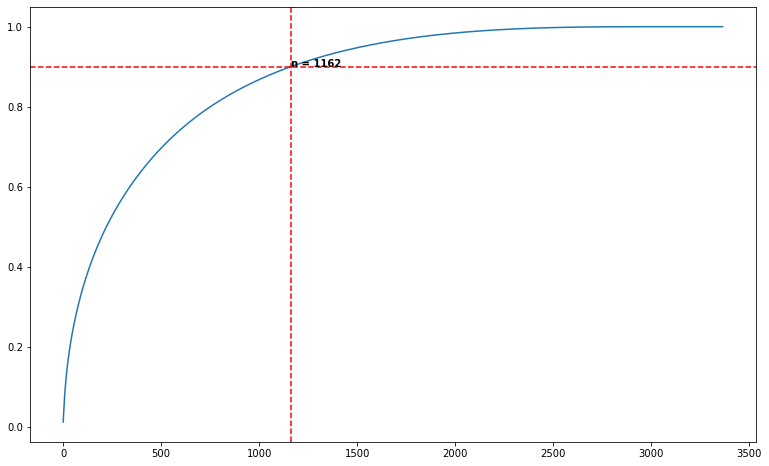

In [6]:
# clean the text data
cleaned_general = cleaned_titles(df)[['stemmed_text']]

# vectorize
tfidf_gen, features_gen = tfidf_converter(cleaned_general['stemmed_text']
                                          .values)

# convert TFIDF to dataframe
titles_df = pd.DataFrame(tfidf_gen.todense(), columns=features_gen)

# plot variance explained and generate truncated dataframe with the SVs
X_reduced = plot_var_explained(tfidf_gen.todense(), thresh=0.9)

Through Agglomerative Clustering, we identified the optimal threshold to be at `10.896747800434456`. This generated six (6) major clusters.

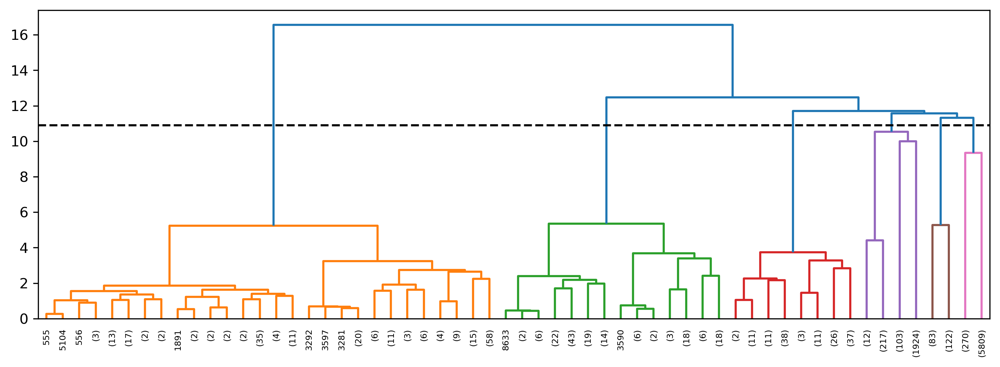

In [7]:
# plot the dendrogram for general clusters using the truncated data
t_general = plot_dendrogram(X_reduced, method='ward', p=5)

Below is an initial attempt to visualize the clusters. Using `SV2` and `SV3`, only the four major clusters appeared to be evident.

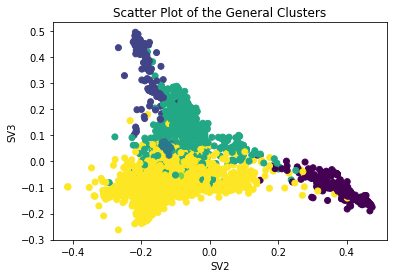

In [8]:
# visualize the general clusters
y_pred_general = plot_fcluster(X_reduced, t_general, 1, 2,
                               'Scatter Plot of the General Clusters')

# add cluster labels to dataframe
titles_df['cluster_label'] = y_pred_general

Such may be the case as the number of bills for each cluster varied greatly as shown in the figure below. 

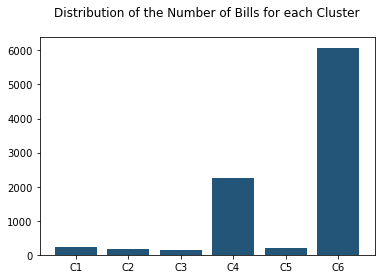

In [9]:
# include cluster labels to dataframe
df_general = df.copy()
df_general['cluster_label'] = y_pred_general

# visualize the distribution of clusters
fig, ax = plt.subplots()
ax.bar(x=[f'C{i}' for i in df_general['cluster_label']
          .value_counts().sort_index().index],
       height=df_general['cluster_label'].value_counts().sort_index(),
       color='#235578')
plt.title('Distribution of the Number of Bills for each Cluster\n')
plt.show()

### Cluster 1: Secondary Education

For the first cluster, `national high school` was very evident in the word cloud below. This appeared to be about conversion of schools into independent ones.

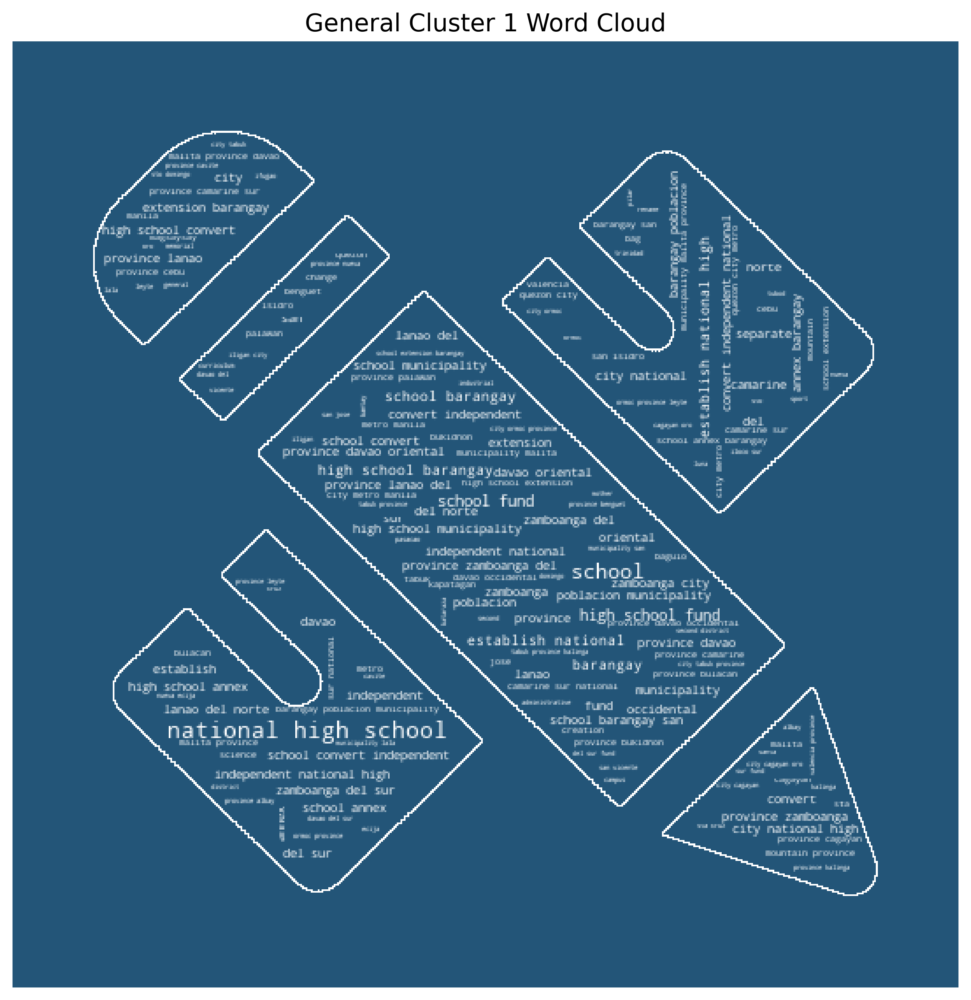

In [42]:
# plot the word cloud for cluster 1
gen_drop = ['high', 'high school', 'high', 'national high', 'national']
gen_idx = df_general[df_general['cluster_label'] == 1].index
wc_gen = (pd.DataFrame(tfidf_gen.todense(),
                       columns=features_gen,
                       index=df_general.index).drop(gen_drop, axis=1)
          .loc[gen_idx, :].sum(axis=0).sort_values(ascending=False))
mask_elec = Image.open('secondary education.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(wc_gen,
                   ListedColormap(['white']),
                   'General Cluster 1 Word Cloud', mask=transformed_mask)

Below is a list of the first ten bills under this cluster.

In [47]:
# generate list of first ten bills under this cluster
for i in df_general[df_general['cluster_label'] == 1]['title'].tolist()[:10]:
    print(f'{i}\n')

AN ACT SEPARATING TABUK CITY NATIONAL HIGH SCHOOL –BANTAY EXTENSION IN BARANGAY BANTAY, CITY OF TABUK, PROVINCE OF KALINGA FROM THE TABUK CITY NATIONAL HIGH SCHOOL, CONVERTING IT INTO AN INDEPENDENT NATIONAL HIGH SCHOOL TO BE KNOWN AS BANTAY NATIONAL HIGH SCHOOL AND APPROPRIATING FUNDS THEREFOR

AN ACT SEPARATING THE BALBALAN AGRICULTURAL AND INDUSTRIAL SCHOOL − BALBALAN PROPER EXTENSION IN BARANGAY BALBALAN PROPER, MUNICIPALITY OF BALBALAN, PROVINCE OF KALINGA FROM THE BALBALAN AGRICULTURAL AND INDUSTRIAL SCHOOL, CONVERTING IT INTO AN INDEPENDENT NATIONAL HIGH SCHOOL TO BE KNOWN AS EASTERN BALBALAN NATIONAL HIGH SCHOOL AND APPROPRIATING FUNDS THEREFOR

AN ACT RENAMING CONSTANCIO PADILLA NATIONAL HIGH SCHOOL IN SAN JOSE CITY, NUEVA ECIJA TO SAN JOSE CITY NATIONAL HIGH SCHOOL

AN ACT ESTABLISHING A NATIONAL HIGH SCHOOL IN BARANGAY TUMANA IN THE SECOND DISTRICT, CITY OF MARIKINA, TO BE KNOWN AS TUMANA NATIONAL HIGH SCHOOL, AND APPROPRIATING FUNDS THEREFOR

AN ACT ESTABLISHING A SENIOR HI

Education as one of the clusters that emerge confirms that it is a constant Congressional priority, partly due to its mandate as required by the Constitution. Apart from the need to have education as the largest budget item every year, part of Congress' work is approving the establishment of schools in different locations across the country. Expectedly these are submitted by their own district representatives, usually depending on the need: some bills require the establishment of *new* schools, while some require the *separation* of schools through annexes. Interestingly, changing the *name* of the school also require Congressional approval.

### Cluster 2: TESDA
The second cluster appeared to be all about the training assessment and skills development programs of Technical Education and Skills Development Authority (TESDA).

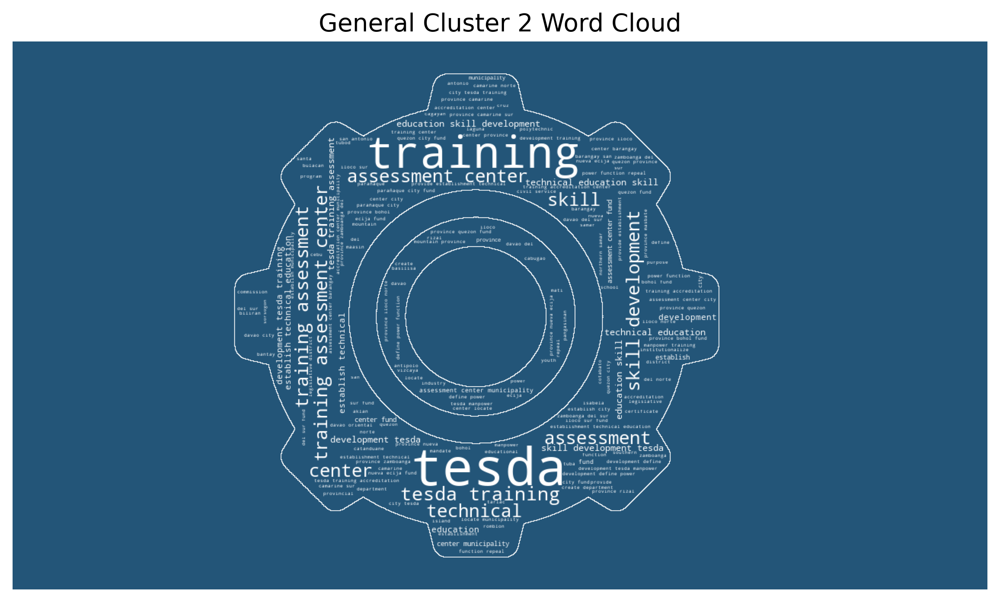

In [50]:
# plot the word cloud for cluster 2
gen_idx = df_general[df_general['cluster_label'] == 2].index
wc_gen = (pd.DataFrame(tfidf_gen.todense(),
                       columns=features_gen,
                       index=df_general.index)
          .loc[gen_idx, :].sum(axis=0).sort_values(ascending=False))
mask_elec = Image.open('tesda.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(wc_gen,
                   ListedColormap(['white']),
                   'General Cluster 2 Word Cloud', mask=transformed_mask)

Below is a list of the first ten bills under this cluster.

In [49]:
# generate list of first ten bills under this cluster
for i in df_general[df_general['cluster_label'] == 2]['title'].tolist()[:10]:
    print(f'{i}\n')

AN ACT PROVIDING FOR THE ESTABLISHMENT OF THE TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) TRAINING AND ACCREDITATION CENTER IN THE CITY OF ANTIPOLO, PROVINCE OF RIZAL, TO BE KNOWN AS THE ANTIPOLO CITY TESDA TRAINING CENTER AND ACCREDITATION CENTER, AND APPROPRIATING FUNDS THEREFOR

AN ACT PROVIDING FOR THE ESTABLISHMENT OF A TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) TRAINING AND ACCREDITATION CENTER IN BARANGAY CAMAMAN-AN, CAGAYAN DE ORO CITY, TO BE KNOWN AS THE CAGAYAN DE ORO CITY TESDA TRAINING AND ACCREDITATION CENTER, AND APPROPRIATING FUNDS THEREFOR

AN ACT INSTITUTIONALIZING AND ENHANCING THE SKILLS CERTIFICATE EQUIVALENCY PROGRAM (SCEP) OF THE CIVIL SERVICE COMMISSION (CSC) AND THE TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) AND FOR OTHER PURPOSES

AN ACT ESTABLISHING A TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) TRAINING CENTER IN THE MUNICIPALITY OF KALIBO, PROVINCE OF AKLAN, TO BE KNOWN AS THE KALIBO, AKLAN

Expectedly, TESDA also ranks high due to its relation to education. Being the provider of technical-vocational education and training (TVET) as required by law, the establishment of new training centers require Congressional approval. Part of TESDA's programs and services are also related to the competency assessment, certification, and program accreditation of TVET programs that are provided privately outside TESDA. 

### Cluster 3: Judiciary
Cluster 3 seemed to be about the reorganization in regional and municipal trial courts.

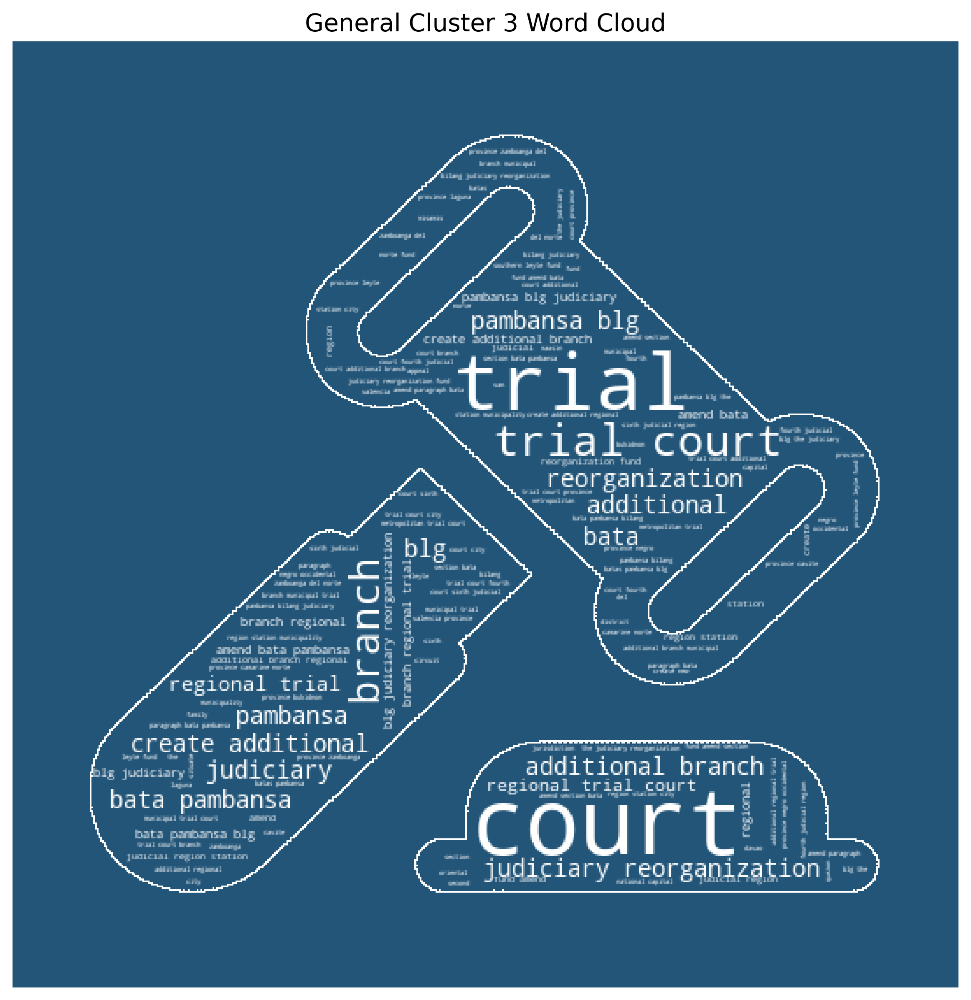

In [51]:
# plot the word cloud for cluster 3
gen_idx = df_general[df_general['cluster_label'] == 3].index
wc_gen = (pd.DataFrame(tfidf_gen.todense(),
                       columns=features_gen,
                       index=df_general.index)
          .loc[gen_idx, :].sum(axis=0).sort_values(ascending=False))
mask_elec = Image.open('judiciary.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(wc_gen,
                   ListedColormap(['white']),
                   'General Cluster 3 Word Cloud', mask=transformed_mask)

Below is a list of the first ten bills under this cluster.

In [52]:
# generate list of first ten bills under this cluster
for i in df_general[df_general['cluster_label'] == 3]['title'].tolist()[:10]:
    print(f'{i}\n')

AN ACT CREATING AN ADDITIONAL TWO (2) METROPOLITAN TRIAL COURT BRANCHES IN THE CITY OF PARAÑAQUE AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING TWO (2) ADDITIONAL BRANCHES OF THE REGIONAL TRIAL COURT IN THE FOURTH JUDICIAL REGION TO BE STATIONED IN THE CITY OF GENERAL TRIAS, PROVINCE OF CAVITE AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING TWO (2) ADDITIONAL BRANCHES OF THE MUNICIPAL TRIAL COURT IN CITIES IN THE CITY OF BACOLOD, THEREBY AMENDING SECTION 29 OF BATAS PAMBANSA BILANG 129, OTHERWISE KNOWN AS THE JUDICIARY REORGANIZATION ACT OF 1980, AS AMENDED, AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING TWO (2) ADDITIONAL REGIONAL TRIAL COURTS AND TWO (2) ADDITIONAL MUNICIPAL TRIAL COURTS IN CITIES IN THE CITY OF MATI, DAVAO ORIENTAL, AMENDING FOR THE PURPOSE BATAS PAMBANSA BLG. 129 OTHERWISE KNOWN AS THE 'JUDICIARY REORGANIZATION ACT OF 1980', AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING ONE (1) ADDITIONAL BRANCH OF THE MUNICIPAL TRIAL COURT IN CITIES (MTCC) IN THE CITY 

Bills related to the judiciary also emerged as one of the clusters. As one of the co-equal branches of the government, House representatives usually provide courtesy to requests made by their counterparts to emphasize their "co-equality". For example, during budget hearings, House representatives usually approve the budgets of the President and Vice-President in just a few minutes. Most of these bills relate to the expansion of the reach of the Judiciary through the establishment of new branches of Court.

### Cluster 4: Build, Build, Build
Cluster 4 appeared to be about infrastructure, specifically for the conversion or construction of public works and highways.

In [ ]:
# plot the word cloud for cluster 4
gen_drop = ['declare', 'del', 'sur', 'establish', 'provide',
            'national', 'municipality', 'city', 'barangay',
            'province', 'district', 'fund', 'road', 'road fund']
gen_idx = df_general[df_general['cluster_label'] == 4].index
wc_gen = (pd.DataFrame(tfidf_gen.todense(),
                       columns=features_gen,
                       index=df_general.index).drop(gen_drop, axis=1)
          .loc[gen_idx, :].sum(axis=0).sort_values(ascending=False))
mask_elec = Image.open('build.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(wc_gen,
                   ListedColormap(['white']),
                   'General Cluster 4 Word Cloud', mask=transformed_mask)

Below is a list of the first ten bills under this cluster.

In [53]:
# generate list of first ten bills under this cluster
for i in df_general[df_general['cluster_label'] == 4]['title'].tolist()[:10]:
    print(f'{i}\n')

AN ACT PROVIDING FOR THE CONSTRUCTION OF SKYWAY OVERPASSES OVER AND TUNNEL UNDERPASSES UNDER THE THREE (3) MOST CONGESTED ROAD SECTIONS IN THE FIRST DISTRICT OF THE CITY OF CEBU AND APPROPRIATING FUNDS THEREFOR

AN ACT RENAMING THE MACTAN-CEBU INTERNATIONAL AIRPORT AUTHORITY TO LAPU-LAPU - CEBU INTERNATIONAL AIRPORT AUTHORITY AND MACTAN-CEBU INTERNATIONAL AIRPORT TO LAPU-LAPU - CEBU INTERNATIONAL AIRPORT

AN ACT PROVIDING FOR THE ESTABLISHMENT AND CONSTRUCTION OF A SECOND RUNWAY AT THE MACTAN-CEBU INTERNATIONAL AIRPORT (MCIA) WITH ITS CONCOMITANT ACCESS TAXIWAYS AND RAPID EXIT TAXIWAYS (RET), RUNWAY LIGHTING SYSTEMS, AND NAVIGATIONAL/LANDING EQUIPMENT, AND APPROPRIATING FUNDS THEREFOR

AN ACT PROVIDING FOR THE CONSTRUCTION OF A BRIDGE FROM CEBU CITY TO THE MUNICIPALITY OF CORDOVA, PROVINCE OF CEBU AND A COASTAL ROAD/EXPRESSWAY TO THE MACTAN–CEBU INTERNATIONAL AIRPORT, LAPU-LAPU CITY, AS WELL AS A BRIDGE FROM THE MUNICIPALITY OF CONSOLACION, PROVINCE OF CEBU TO THE MACTAN–CEBU INTERNATI

This cluster is unique in the sense that it is not a Congressional mandate as required by the Constitution. Rather, this is a Presidential priority; in fact, President Duterte has repeatedly emphasized his "Build, Build, Build" program every SONA and in between. Congress has likewise been receptive to the agenda set by the President, given that the Department of Public Works and Highways consistently receives one of the highest budget allocations yearly. Bills related to this cluster focus on the construction of bridges, roads, and even restrooms. They, however, are not simply connected to infrastructure; some bills are also related to the protection of environmental areas, such as "An Act Establishing Marine Protected Areas in All Coastal Municipalities and Cities".

### Cluster 5: Franchise

Cluster 5 seemed to be about franchises for broadcasting and utility companies as their operation require Congressional approval. 

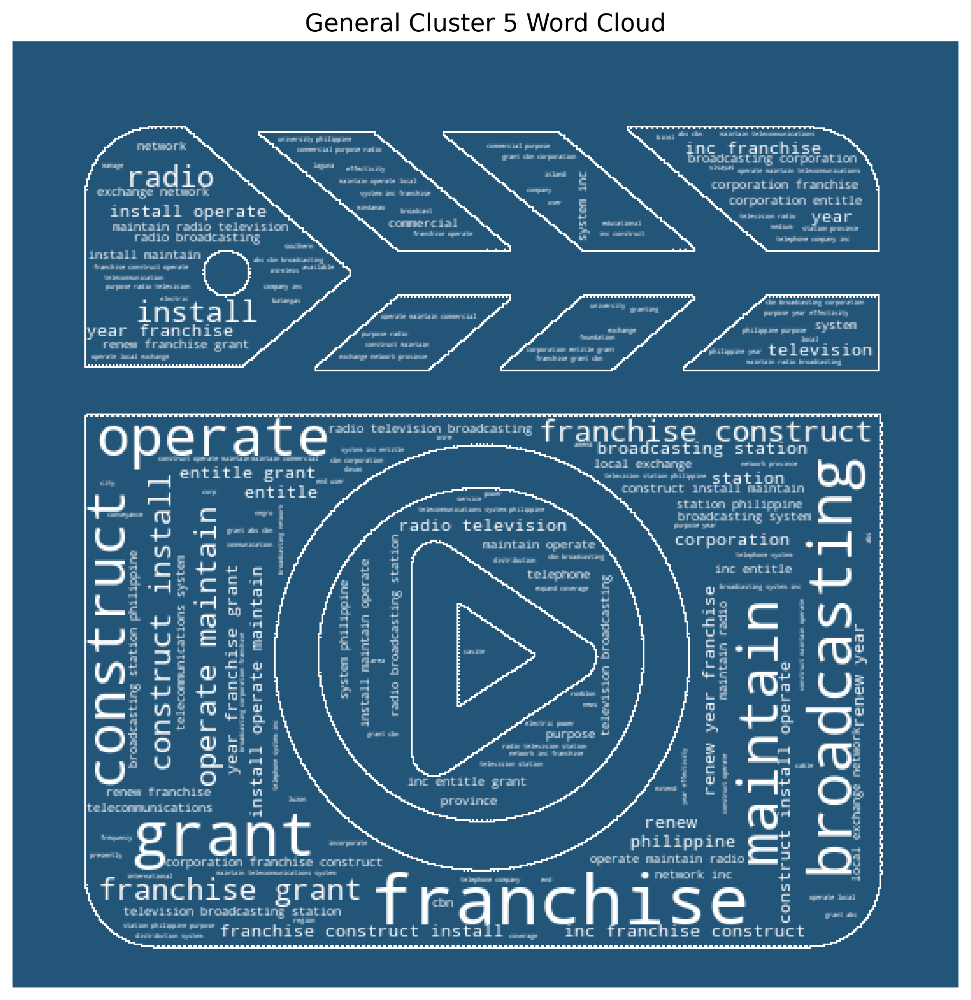

In [54]:
# plot the word cloud for cluster 5
gen_drop = ['inc']
gen_idx = df_general[df_general['cluster_label'] == 5].index
wc_gen = (pd.DataFrame(tfidf_gen.todense(),
                       columns=features_gen,
                       index=df_general.index).drop(gen_drop, axis=1)
          .loc[gen_idx, :].sum(axis=0).sort_values(ascending=False))
mask_elec = Image.open('franchise.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(wc_gen, ListedColormap(['white']),
                   'General Cluster 5 Word Cloud', mask=transformed_mask)

Below is a list of the first ten bills under this cluster.

In [55]:
# generate list of first ten bills under this cluster
for i in df_general[df_general['cluster_label'] == 5]['title'].tolist()[:10]:
    print(f'{i}\n')

AN ACT GRANTING THE BICOL LIGHT AND POWER CORPORATION A FRANCHISE TO CONSTRUCT, INSTALL, ESTABLISH, OPERATE, OWN, MANAGE AND MAINTAIN DISTRIBUTION SYSTEMS FOR THE CONVEYANCE OF ELECTRIC POWER TO THE END-USERS IN THE TOWNS OF BAAO, BALATAN, BATO, BUHI, BULA, NABUA, AND THE CITY OF IRIGA, PROVINCE OF CAMARINES SUR, AND FOR OTHER PURPOSES

AN ACT RENEWING THE FRANCHISE GRANTED TO ABS-CBN CORPORATION (FORMERLY ABS-CBN BROADCASTING CORPORATION) UNDER REPUBLIC ACT NO. 7966 OR ꞌAN ACT GRANTING ABS-CBN BROADCASTING CORPORATION A FRANCHISE TO CONSTRUCT, INSTALL, ESTABLISH, OPERATE, AND MAINTAIN BROADCASTING STATIONS IN THE PHILIPPINES, AND FOR OTHER PURPOSESꞌ FOR TWENTY-FIVE (25) YEARS FROM THE EFFECTIVITY OF THIS ACT

AN ACT RENEWING THE FRANCHISE GRANTED TO JOSE M. LUISON AND SONS, INC. TO CONSTRUCT, INSTALL, OPERATE AND MAINTAIN FOR COMMERCIAL PURPOSES RADIO AND TELEVISION BROADCAST STATIONS IN THE PHILIPPINES UNDER R.A. 8132 FOR ANOTHER TWENTY-FIVE (25) YEARS FROM THE DATE OF APPROVAL OF TH

Network and broadcasting franchises require Congressional approval prior their operation. As one of the themes that emerge, the House regularly receives applications for the extension of operations of the broadcasting and network stations. One of the interesting bills that emerged was about the renewal of ABS-CBN's franchise, which was highly-contentious given the political and financial issues that came along with the debates and discussions. Even if this cluster relates to compliance to a Constitutional mandate, the bill relating to ABS-CBN was the sole item that continues to be part of the President's agenda, which the House continues to comply with.

### Cluster 6: General Public Service
Cluster 6 contained all other state services for the public which include services for health, education and children among others.

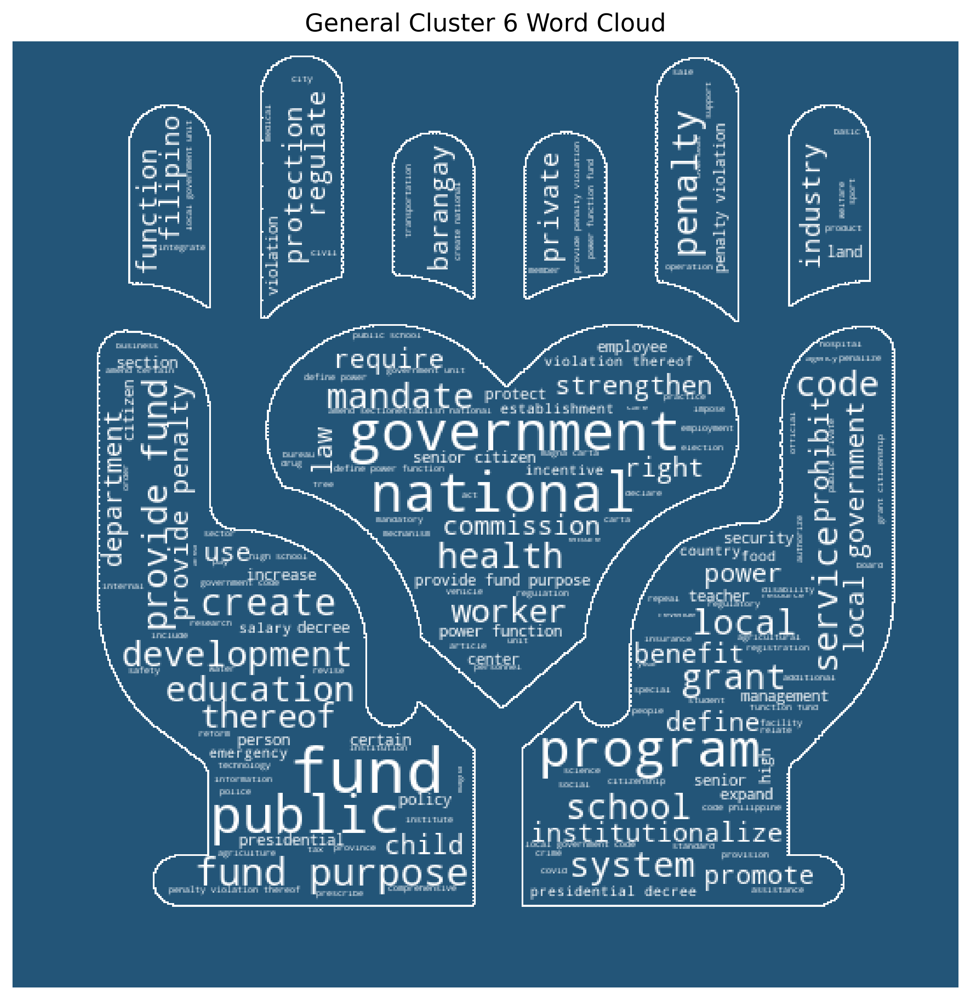

In [13]:
# plot the word cloud for cluster 6
gen_drop = ['philippine', 'program',
            'mandate', 'code', 'thereof', 'define', 'certain', 'require',
            'providing', 'function', 'promotion', 'regulate',
            'development', 'national', 'use', 'system',
            'promote', 'grant', 'establishment', 'service']
gen_idx = df_general[df_general['cluster_label'] == 6].index
wc_gen = (pd.DataFrame(tfidf_gen.todense(),
                       columns=features_gen,
                       index=df_general.index).drop(gen_drop, axis=1)
          .loc[gen_idx, :].sum(axis=0).sort_values(ascending=False))
mask_elec = Image.open('general.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(wc_gen, ListedColormap(['white']),
                   'General Cluster 6 Word Cloud', mask=transformed_mask)

Below is a list of the first ten bills under this cluster.

In [87]:
# generate list of first ten bills under this cluster
for i in df_general[df_general['cluster_label'] == 6]['title'].tolist()[:10]:
    print(f'{i}\n')

AN ACT INSTITUTIONALIZING A NATIONAL VALUES, ETIQUETTE, AND MORAL UPRIGHTNESS PROGRAM

AN ACT CREATING THE DEPARTMENT OF OVERSEAS FILIPINO WORKERS (OFW) AND FOREIGN EMPLOYMENT, DEFINING ITS POWERS AND FUNCTIONS, APPROPRIATING FUNDS THEREFOR, RATIONALIZING THE ORGANIZATION AND FUNCTIONS OF GOVERNMENT AGENCIES RELATED TO MIGRATION, AND FOR OTHER PURPOSES

AN ACT PROVIDING FOR A NATIONAL PROGRAM TO SUPPORT AND CARE FOR THE ABANDONED, NEGLECTED, AND VOLUNTARY COMMITTED CHILDREN, CREATING A SPECIAL TRUST FUND, AND FOR OTHER PURPOSES

AN ACT CREATING THE EMERGENCY RESPONSE DEPARTMENT (ERD), APPROPRIATING FUNDS THEREFOR, AND FOR OTHER PURPOSES

AN ACT INSTITUTIONALIZING MICROFINANCE PROGRAMS AND ACCESS TO CAPITAL TO SUPPORT AND GROW MICRO, SMALL, AND MEDIUM ENTERPRISES (MSMEs), ALLOCATING FUNDS THEREFOR, AND FOR OTHER PURPOSES

AN ACT PROVIDING FOR ADDITIONAL SUPPORT AND COMPENSATION FOR EDUCATORS IN BASIC EDUCATION

AN ACT CREATING A DEPARTMENT OF FISHERIES AND AQUATIC RESOURCES PROVIDING FO

Any other bills that fall outside other clusters appeared here. Interestingly, given that the government provides public service, this cluster provides a comprehensive and diverse list of bills that relate to different government functions. For example, there appears to be a mix of words relating to `health`, `development`, and `senior citizen`. Looking at some of the bills under the cluster, they relate to different areas - from disaster risk reduction and management to foreign service.

## Comparison of Bills Not Passed and Bills Passed into Law

While 6 clusters have emerged, it is important to compare bills that pass and did not or are yet to pass. We assume that the bills that pass are part of Congressional priorities, possibly through a Constitutional mandate or as part of agenda items set by the President.

To facilitate this comparison, the `mother_bill_status` and `status` were considered. Those containing the `Republic Act` were tagged as `passed` and those that did not contain such as `not passed`.

In [5]:
# tag the bills as passed or not passed
df['pass_or_not'] = bill_labelling(df)

# generate the dataframe for bills that were not passed
df_not_passed = df[df.pass_or_not == 'not passed']

# generate the dataframe for bills that were passed
df_passed = df[df.pass_or_not == 'passed']

### Clusters of Themes of Bills Not Passed

After cleaning and vectorizing the titles of bills that were not passed into law, the resulting matrix has 3672 columns. To preserve 90% of the information, a total of 1226 SVs were used after latent semantic analysis. Transformation of the matrix was then done.

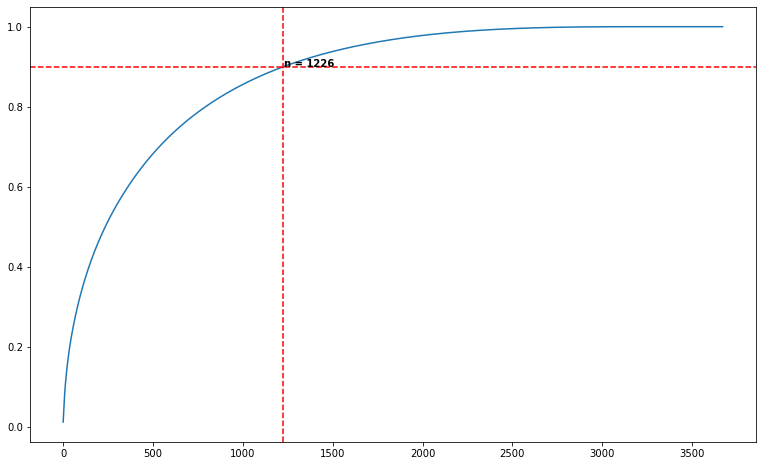

In [6]:
# clean the text data
df_np = df_not_passed[['title']]
cleaned_titles_np = cleaned_titles(df_np)[['stemmed_text']]

# vectorize
bow_cong_np, cols_np = tfidf_converter(
    cleaned_titles_np['stemmed_text'].values)
nonzeros = bow_cong_np.sum(axis=1).nonzero()[0]
bow_cong_np = bow_cong_np[nonzeros]

# plot variance explained
np_ = plot_var_explained(bow_cong_np.todense(), 0.9)

# generate truncated dataframe with the SVs
tsvd_test_np = TruncatedSVD(n_components=1226)
X_cong_np_new = tsvd_test_np.fit_transform(bow_cong_np.todense())

Through Agglomerative Clustering, we identified the optimal threshold to be at 10.390079646785619. This generated five (5) major clusters.

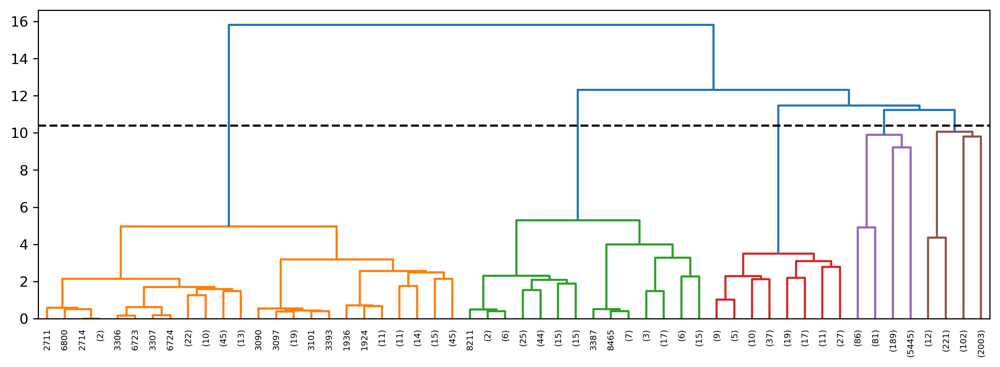

In [7]:
# visualize the clusters
t2 = plot_dendrogram(X_cong_np_new, method='ward', p=5)

Below is an initial attempt to visualize the clusters. Using SV5 and SV76, the 5 clusters can be seen although not compact.

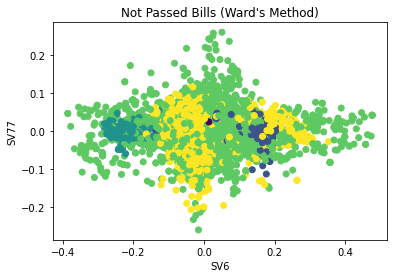

In [8]:
# visualize the clusters
y_pred2 = plot_fcluster(X_cong_np_new, t2, 5, 76,
                        'Not Passed Bills (Ward\'s Method)')

# add cluster labels to dataframe
df_not_passed['cluster_label'] = y_pred2

Such may be the case as the number of bills for each cluster varied greatly as shown in the figure below.

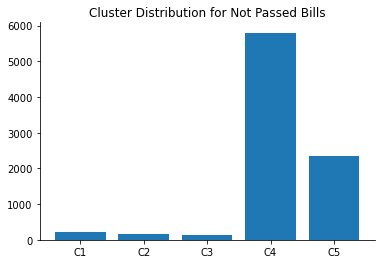

In [9]:
# visualize the clusters
fig, ax = plt.subplots()
ax.bar(x=[f'C{i}' for i in df_not_passed['cluster_label']
          .value_counts().sort_index().index],
       height=df_not_passed['cluster_label'].value_counts().sort_index())
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.title('Cluster Distribution for Not Passed Bills')
plt.show()

#### Cluster 1: Education

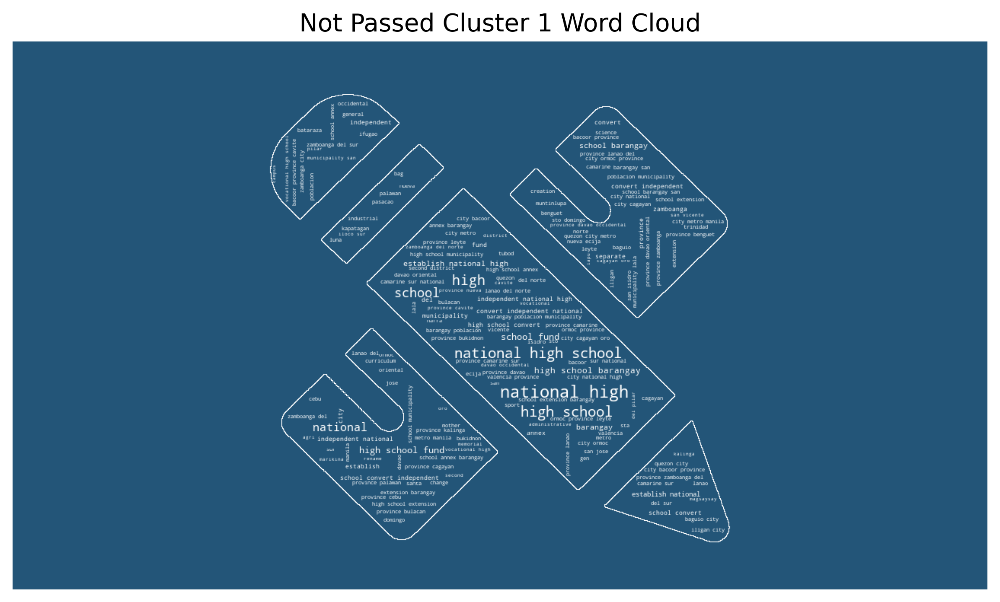

In [10]:
# plot the word cloud for cluster 1
idx_c1 = df_not_passed[df_not_passed.cluster_label == 1].index
drop_c1 = ['high', 'school', 'national', 'national high',
           'high school know', 'national high school', 'high school barangay',
           'establish national', 'school barangay', 'high school fund',
           'establish national high', 'barangay', 'municipality', 'know',
           'province', 'school know', 'establish', 'del sur know']
drop_c1 = []
ser_c1 = (pd.DataFrame(bow_cong_np.todense(),
                       columns=cols_np,
                       index=df_not_passed.index)
          .loc[idx_c1, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c1, axis=0))
mask_sec = Image.open('secondary.png')
mask_sec = np.array(mask_sec.convert('1'))
transformed_mask = np.ndarray((mask_sec.shape[0], mask_sec.shape[1]),
                              np.int32)
for i in range(len(mask_sec)):
    transformed_mask[i] = list(map(transform_format, mask_sec[i]))
wordcloud_plotting(ser_c1,
                   ListedColormap(['white']),
                   'Not Passed Cluster 1 Word Cloud', mask=transformed_mask)

In [11]:
# generate list of first ten bills under this cluster
for i in df_not_passed.loc[idx_c1, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT SEPARATING THE BALBALAN AGRICULTURAL AND INDUSTRIAL SCHOOL − BALBALAN PROPER EXTENSION IN BARANGAY BALBALAN PROPER, MUNICIPALITY OF BALBALAN, PROVINCE OF KALINGA FROM THE BALBALAN AGRICULTURAL AND INDUSTRIAL SCHOOL, CONVERTING IT INTO AN INDEPENDENT NATIONAL HIGH SCHOOL TO BE KNOWN AS EASTERN BALBALAN NATIONAL HIGH SCHOOL AND APPROPRIATING FUNDS THEREFOR

AN ACT RENAMING CONSTANCIO PADILLA NATIONAL HIGH SCHOOL IN SAN JOSE CITY, NUEVA ECIJA TO SAN JOSE CITY NATIONAL HIGH SCHOOL

AN ACT ESTABLISHING A NATIONAL HIGH SCHOOL IN BARANGAY TUMANA IN THE SECOND DISTRICT, CITY OF MARIKINA, TO BE KNOWN AS TUMANA NATIONAL HIGH SCHOOL, AND APPROPRIATING FUNDS THEREFOR

AN ACT ESTABLISHING A SENIOR HIGH SCHOOL IN BARANGAY TALIPAPA, QUEZON CITY, METRO MANILA TO BE KNOWN AS TALIPAPA NATIONAL HIGH SCHOOL, AND APPROPRIATING FUNDS THEREFOR

AN ACT SEPARATING MUNTINLUPA NATIONAL HIGH SCHOOL NBP ANNEX IN BARANGAY POBLACION, CITY OF MUNTINLUPA, METRO MANILA, FROM MUNTINLUPA NATIONAL HIGH SCHOOL, CONV

Even if education appeared to be a priority for Congress during the earlier section, it appeared that most bills have not pass the House anyway. Given the long list of districts that require the establishments of schools, the context of education has greatly changed before and during the pandemic - as the Department of Education has specifically made the switch from face-to-face classes to remote learning.

#### Cluster 2: TESDA

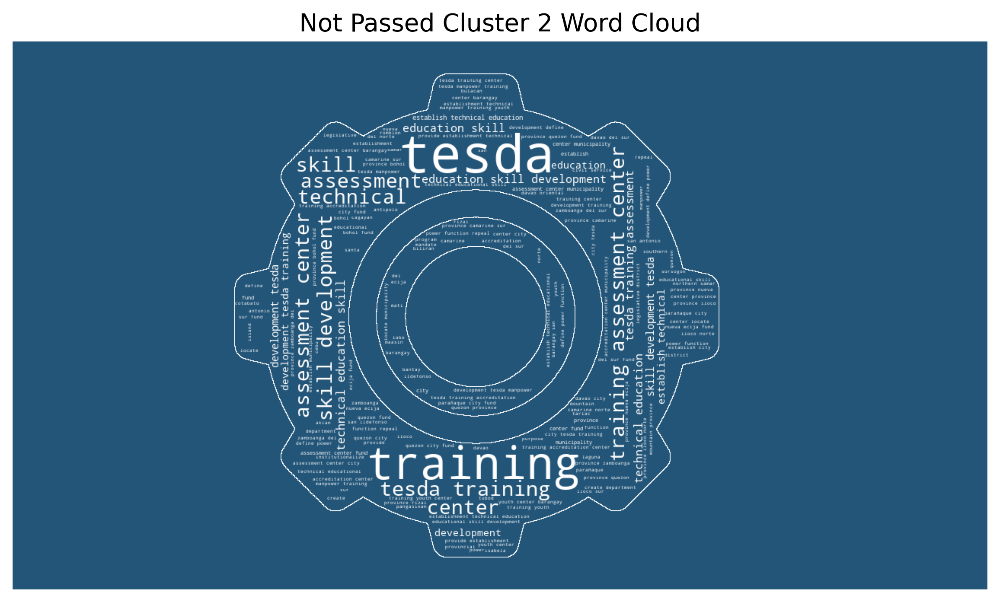

In [12]:
# plot the word cloud for cluster 2
idx_c2 = df_not_passed[df_not_passed.cluster_label == 2].index
drop_c2 = ['training assessment']
ser_c2 = (pd.DataFrame(bow_cong_np.todense(),
                       columns=cols_np,
                       index=df_not_passed.index)
          .loc[idx_c2, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c2, axis=0))
mask_tesda = Image.open('tesda.png')
mask_tesda = np.array(mask_tesda.convert('1'))
transformed_mask = np.ndarray((mask_tesda.shape[0], mask_tesda.shape[1]),
                              np.int32)
for i in range(len(mask_tesda)):
    transformed_mask[i] = list(map(transform_format, mask_tesda[i]))
wordcloud_plotting(ser_c2,
                   ListedColormap(['white']),
                   'Not Passed Cluster 2 Word Cloud', mask=transformed_mask)

In [13]:
# generate list of first ten bills under this cluster
for i in df_not_passed.loc[idx_c2, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT PROVIDING FOR THE ESTABLISHMENT OF THE TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) TRAINING AND ACCREDITATION CENTER IN THE CITY OF ANTIPOLO, PROVINCE OF RIZAL, TO BE KNOWN AS THE ANTIPOLO CITY TESDA TRAINING CENTER AND ACCREDITATION CENTER, AND APPROPRIATING FUNDS THEREFOR

AN ACT PROVIDING FOR THE ESTABLISHMENT OF A TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) TRAINING AND ACCREDITATION CENTER IN BARANGAY CAMAMAN-AN, CAGAYAN DE ORO CITY, TO BE KNOWN AS THE CAGAYAN DE ORO CITY TESDA TRAINING AND ACCREDITATION CENTER, AND APPROPRIATING FUNDS THEREFOR

AN ACT INSTITUTIONALIZING AND ENHANCING THE SKILLS CERTIFICATE EQUIVALENCY PROGRAM (SCEP) OF THE CIVIL SERVICE COMMISSION (CSC) AND THE TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) AND FOR OTHER PURPOSES

AN ACT ESTABLISHING A TECHNICAL EDUCATION AND SKILLS DEVELOPMENT AUTHORITY (TESDA) TRAINING CENTER IN THE MUNICIPALITY OF KALIBO, PROVINCE OF AKLAN, TO BE KNOWN AS THE KALIBO, AKLAN

TESDA has resurfaced in this section, showing that most of the bills related to the establishment of TESDA training centers have yet to be realized. Similar to the earlier cluster, the shift to online education may have impacted Congress' priorities when it comes to the establishment of its accreditation centers.

#### Cluster 3: Judiciary

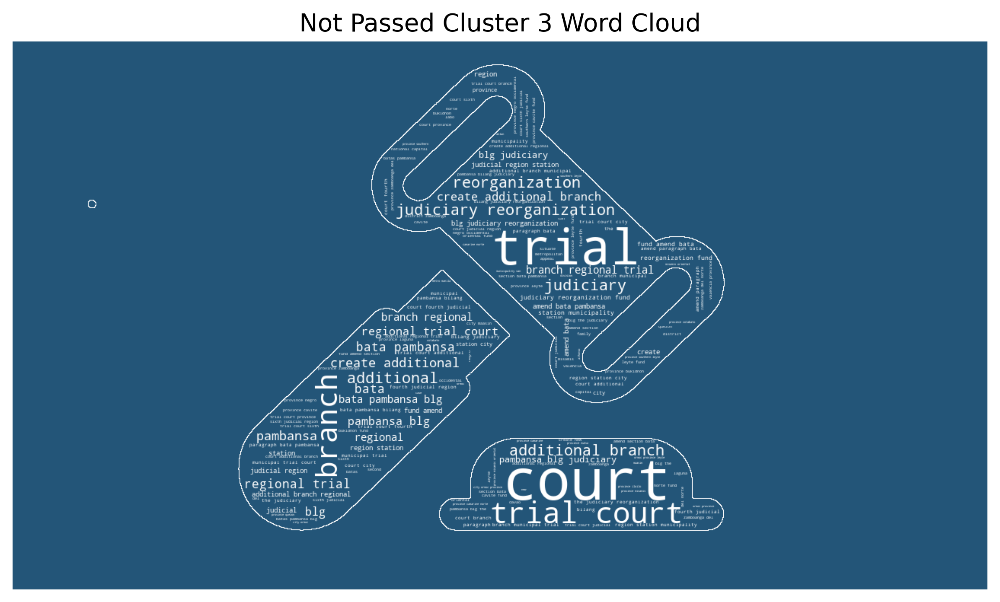

In [14]:
# plot the word cloud for cluster 3
idx_c3 = df_not_passed[df_not_passed.cluster_label == 3].index
drop_c3 = ['amend', 'purpose', 'provide', 'national', 'fund', 'government',
           'establish', 'program', 'fund', 'fund purpose']
ser_c3 = (pd.DataFrame(bow_cong_np.todense(),
                       columns=cols_np,
                       index=df_not_passed.index)
          .loc[idx_c3, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c3, axis=0))
mask_gen = Image.open('judi.png')
mask_gen = np.array(mask_gen.convert('1'))
transformed_mask = np.ndarray((mask_gen.shape[0], mask_gen.shape[1]),
                              np.int32)
for i in range(len(mask_gen)):
    transformed_mask[i] = list(map(transform_format, mask_gen[i]))
wordcloud_plotting(ser_c3,
                   ListedColormap(['white']),
                   'Not Passed Cluster 3 Word Cloud', mask=transformed_mask)

In [15]:
# generate list of first ten bills under this cluster
for i in df_not_passed.loc[idx_c3, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT CREATING AN ADDITIONAL TWO (2) METROPOLITAN TRIAL COURT BRANCHES IN THE CITY OF PARAÑAQUE AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING TWO (2) ADDITIONAL BRANCHES OF THE REGIONAL TRIAL COURT IN THE FOURTH JUDICIAL REGION TO BE STATIONED IN THE CITY OF GENERAL TRIAS, PROVINCE OF CAVITE AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING TWO (2) ADDITIONAL BRANCHES OF THE MUNICIPAL TRIAL COURT IN CITIES IN THE CITY OF BACOLOD, THEREBY AMENDING SECTION 29 OF BATAS PAMBANSA BILANG 129, OTHERWISE KNOWN AS THE JUDICIARY REORGANIZATION ACT OF 1980, AS AMENDED, AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING TWO (2) ADDITIONAL REGIONAL TRIAL COURTS AND TWO (2) ADDITIONAL MUNICIPAL TRIAL COURTS IN CITIES IN THE CITY OF MATI, DAVAO ORIENTAL, AMENDING FOR THE PURPOSE BATAS PAMBANSA BLG. 129 OTHERWISE KNOWN AS THE 'JUDICIARY REORGANIZATION ACT OF 1980', AND APPROPRIATING FUNDS THEREFOR

AN ACT CREATING ONE (1) ADDITIONAL BRANCH OF THE MUNICIPAL TRIAL COURT IN CITIES (MTCC) IN THE CITY 

Unfortunately, even bills related to the Judiciary were not passed. This included mostly the establishment of courts and the changing of jurisdictions they cover.

#### Cluster 4: General Public Service

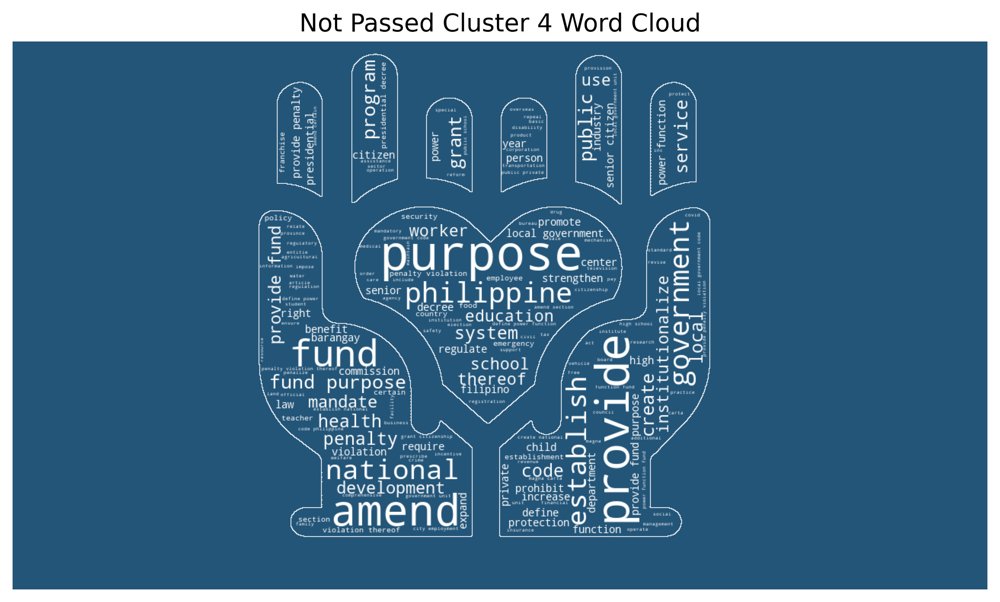

In [16]:
# plot the word cloud for cluster 4
idx_c4 = df_not_passed[df_not_passed.cluster_label == 4].index
drop_c4 = ['trial', 'court']
ser_c4 = (pd.DataFrame(bow_cong_np.todense(),
                       columns=cols_np,
                       index=df_not_passed.index)
          .loc[idx_c4, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c4, axis=0))
mask_judi = Image.open('gen.png')
mask_judi = np.array(mask_judi.convert('1'))
transformed_mask = np.ndarray((mask_judi.shape[0], mask_judi.shape[1]),
                              np.int32)
for i in range(len(mask_judi)):
    transformed_mask[i] = list(map(transform_format, mask_judi[i]))
wordcloud_plotting(ser_c4,
                   ListedColormap(['white']),
                   'Not Passed Cluster 4 Word Cloud', mask=transformed_mask)

In [17]:
# generate list of first ten bills under this cluster
for i in df_not_passed.loc[idx_c4, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT CREATING THE DEPARTMENT OF OVERSEAS FILIPINO WORKERS (OFW) AND FOREIGN EMPLOYMENT, DEFINING ITS POWERS AND FUNCTIONS, APPROPRIATING FUNDS THEREFOR, RATIONALIZING THE ORGANIZATION AND FUNCTIONS OF GOVERNMENT AGENCIES RELATED TO MIGRATION, AND FOR OTHER PURPOSES

AN ACT PROVIDING FOR A NATIONAL PROGRAM TO SUPPORT AND CARE FOR THE ABANDONED, NEGLECTED, AND VOLUNTARY COMMITTED CHILDREN, CREATING A SPECIAL TRUST FUND, AND FOR OTHER PURPOSES

AN ACT CREATING THE EMERGENCY RESPONSE DEPARTMENT (ERD), APPROPRIATING FUNDS THEREFOR, AND FOR OTHER PURPOSES

AN ACT INSTITUTIONALIZING MICROFINANCE PROGRAMS AND ACCESS TO CAPITAL TO SUPPORT AND GROW MICRO, SMALL, AND MEDIUM ENTERPRISES (MSMEs), ALLOCATING FUNDS THEREFOR, AND FOR OTHER PURPOSES

AN ACT CREATING A DEPARTMENT OF FISHERIES AND AQUATIC RESOURCES PROVIDING FOR ITS POWERS AND FUNCTIONS, AND FOR OTHER PURPOSES

AN ACT ESTABLISHING THE NATIONAL HEALTH PASSPORT SYSTEM AND STRENGTHENING THE PRIMARY HEALTHCARE SYSTEM, APPROPRIATING FUNDS T

This cluster relates to areas of public service. We have not any priority bills of the President in this cluster.

#### Cluster 5: Build, Build, Build

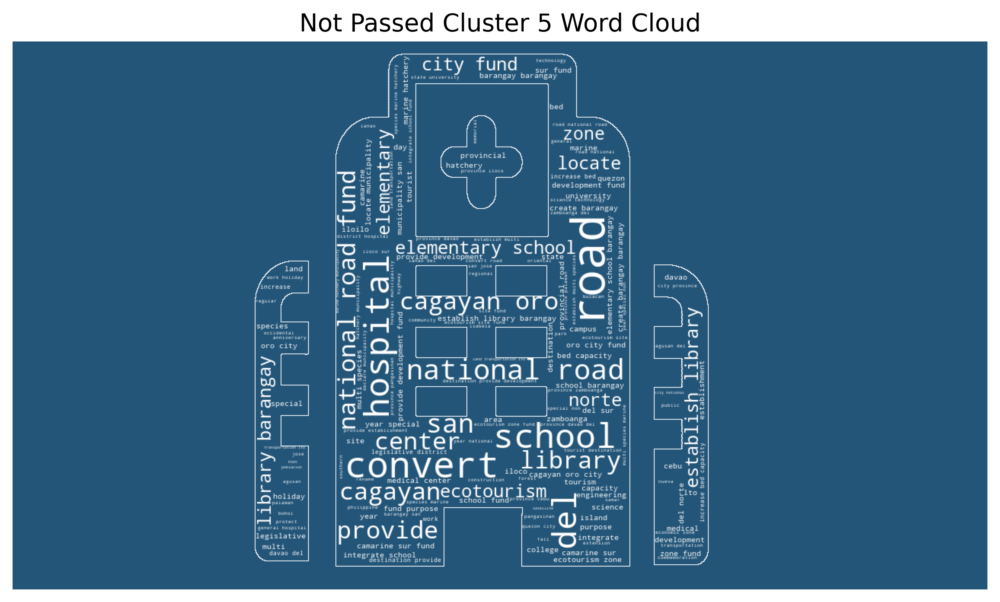

In [18]:
# plot the word cloud for cluster 5
idx_c5 = df_not_passed[df_not_passed.cluster_label == 5].index
drop_c5 = ['municipality', 'oro', 'sur', 'fund',
           'province', 'barangay', 'city', 'district', 'declare',
           'national', 'establish', 'create', 'road fund']
ser_c5 = (pd.DataFrame(bow_cong_np.todense(),
                       columns=cols_np,
                       index=df_not_passed.index)
          .loc[idx_c5, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c5, axis=0))
mask_build = Image.open('build.png')
mask_build = np.array(mask_build.convert('1'))
transformed_mask = np.ndarray((mask_build.shape[0], mask_build.shape[1]),
                              np.int32)
for i in range(len(mask_build)):
    transformed_mask[i] = list(map(transform_format, mask_build[i]))
wordcloud_plotting(ser_c5,
                   ListedColormap(['white']),
                   'Not Passed Cluster 5 Word Cloud', mask=transformed_mask)

In [19]:
# generate list of first ten bills under this cluster
for i in df_not_passed.loc[idx_c5, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT PROVIDING FOR A LIGHT RAIL TRANSPORT (LRT) SYSTEM OR METRO RAIL TRANSPORT (MRT) SYSTEM OR MONORAIL TRANSPORT SYSTEM OR SUCH OTHER APPROPRIATE MODERN MASS TRANSPORT SYSTEM IN THE CITY OF CEBU AND METRO CEBU

AN ACT FOR THE CONSTRUCTION OF A LIGHT RAIL TRANSPORT (LRT) SYSTEM OR METRO RAIL TRANSPORT (MRT) SYSTEM OR MONORAIL TRANSPORT OVER, AS WELL AS A SUBWAY TRANSPORT SYSTEM UNDER THE THREE (3) MOST CONGESTED ROAD SECTIONS IN THE FIRST DISTRICT OF THE CITY OF CEBU AND APPROPRIATING FUNDS THEREFOR

AN ACT PROVIDING FOR THE CONSTRUCTION OF SKYWAY OVERPASSES OVER AND TUNNEL UNDERPASSES UNDER THE THREE (3) MOST CONGESTED ROAD SECTIONS IN THE FIRST DISTRICT OF THE CITY OF CEBU AND APPROPRIATING FUNDS THEREFOR

AN ACT RENAMING THE MACTAN-CEBU INTERNATIONAL AIRPORT AUTHORITY TO LAPU-LAPU - CEBU INTERNATIONAL AIRPORT AUTHORITY AND MACTAN-CEBU INTERNATIONAL AIRPORT TO LAPU-LAPU - CEBU INTERNATIONAL AIRPORT

AN ACT PROVIDING FOR THE ESTABLISHMENT AND CONSTRUCTION OF A SECOND RUNWAY AT THE M

Interestingly, many of the bills that are under the Build, Build, Build cluster are yet to be passed, despite a continued focus of the President on massive infrastructure projects. 

### Clusters of Themes of Bills Passed
Below, we provide the context of the bills that survived. Most of these are part of the President's priorities as he states during the annual SONA and in events in between.

After cleaning and vectorizing the titles of bills that were not passed into law, the resulting matrix has 5,221 columns. To preserve 90% of the information, a total of 208 SVs were used after latent semantic analysis. Transformation of the matrix was then done.

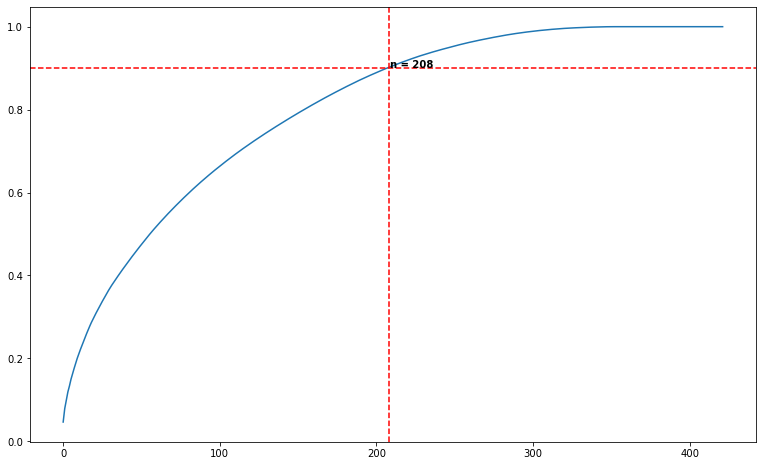

In [20]:
# clean the text data
df_titles = df_passed[['title']]
cleaned_titles_p = cleaned_titles(df_titles)[['stemmed_text']]

# vectorize
bow_cong_p, cols_p = tfidf_converter(cleaned_titles_p['stemmed_text'].values)
nonzeros = bow_cong_p.sum(axis=1).nonzero()[0]
bow_cong_p = bow_cong_p[nonzeros]

# plot variance explained
nt = plot_var_explained(bow_cong_p.todense(), 0.9)

# generate truncated dataframe with the SVs
tsvd_test_p = TruncatedSVD(n_components=208)
X_cong_p_new = tsvd_test_p.fit_transform(bow_cong_p.todense())

Through Agglomerative Clustering, we set the threshold at 4. This generated five (5) major clusters.

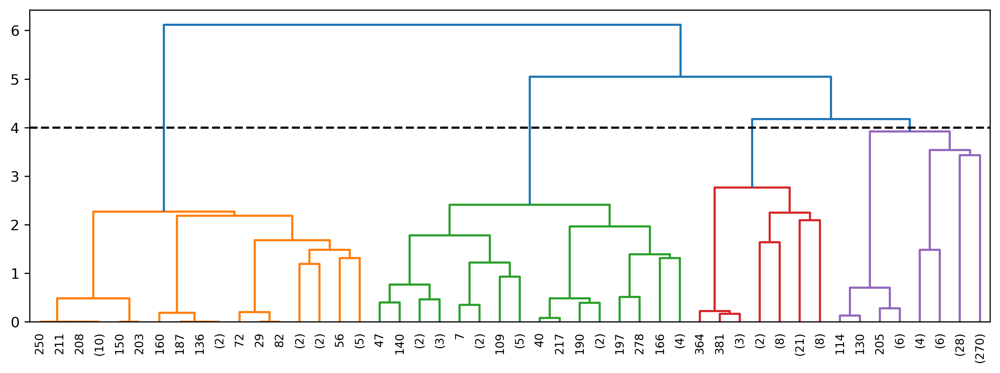

In [21]:
# visualize the clusters
t = plot_dendrogram(X_cong_p_new, method='ward', p=5, thresh=4)

Below is an initial attempt to visualize the clusters. Using SV5 and SV76, the 5 clusters can be seen although not compact.

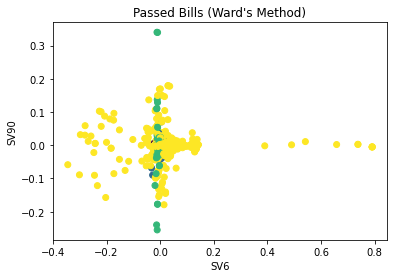

In [22]:
# visualize the clusters
y_pred = plot_fcluster(X_cong_p_new, t, 5, 89,
                       'Passed Bills (Ward\'s Method)')

# add cluster labels to dataframe
df_passed['cluster_label'] = y_pred

Such may be the case as the number of bills for each cluster varied greatly as shown in the figure below.

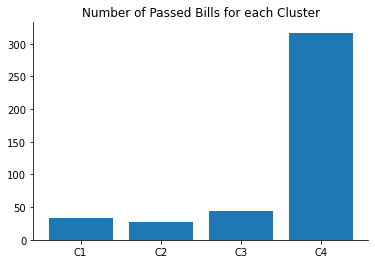

In [23]:
# visualize the clusters
fig, ax = plt.subplots()
ax.bar(x=[f'C{i}' for i in df_passed['cluster_label']
          .value_counts().sort_index().index],
       height=df_passed['cluster_label'].value_counts().sort_index())
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.title('Number of Passed Bills for each Cluster')
plt.show()

#### Cluster 1: SK Election Postponement

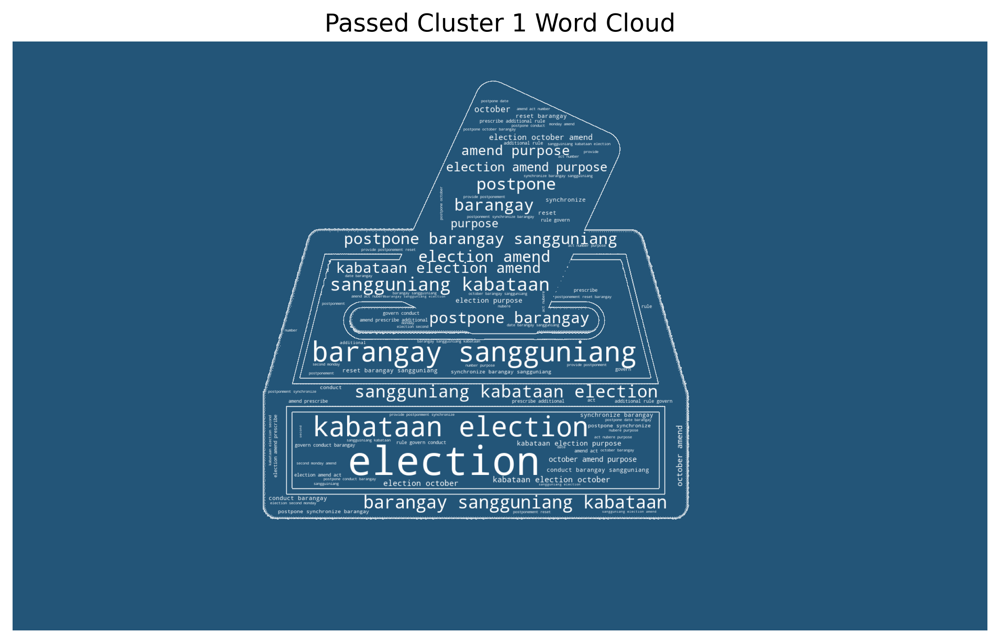

In [24]:
# plot the word cloud for cluster 1
idx_c1 = df_passed[df_passed.cluster_label == 1].index
drop_c1 = ['amend', 'sangguniang', 'kabataan']
ser_c1 = (pd.DataFrame(bow_cong_p.todense(),
                       columns=cols_p,
                       index=df_passed.index)
          .loc[idx_c1, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c1, axis=0))

mask_elec = Image.open('election.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c1,
                   ListedColormap(['white']),
                   'Passed Cluster 1 Word Cloud', mask=transformed_mask)

In [25]:
# generate list of first ten bills under this cluster
for i in df_passed.loc[idx_c1, 'title'].values[: 10]:
    print(f'{i}\n')

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 9164, AS AMENDED, AND FOR OTHER PURPOSES

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 10952, AS AMENDED BY REPUBLIC ACT NO. 9164, REPUBLIC ACT NO. 9340, REPUBLIC ACT NO. 10632, REPUBLIC ACT NO. 10656 AND REPUBLIC ACT NO. 10923, AND FOR OTHER PURPOSES

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 9164, AS AMENDED BY REPUBLIC ACT NO. 9340, REPUBLIC ACT NO. 10656, REPUBLIC ACT NO. 10923 AND REPUBLIC ACT 10952, AND FOR OTHER PURPOSES

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 9164, AS AMENDED BY REPUBLIC ACT NO. 9340 AND REPUBLIC ACT NO. 10656, PRESCRIBING ADDITIONAL RULES GOVERNING THE CONDUCT OF BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS AND FOR OTHER 

The SK Election Postponement was a highly contentious issue, which has dragged on after several years. The issue concerned the effective implementation of the SK Reform Act; the government suggested that postponing the election will enable it to implement the new changes to the SK program while saving money. Others have suggested that it was taking away their right to vote and representation.

#### Cluster 2: Teachers' Salary Increases

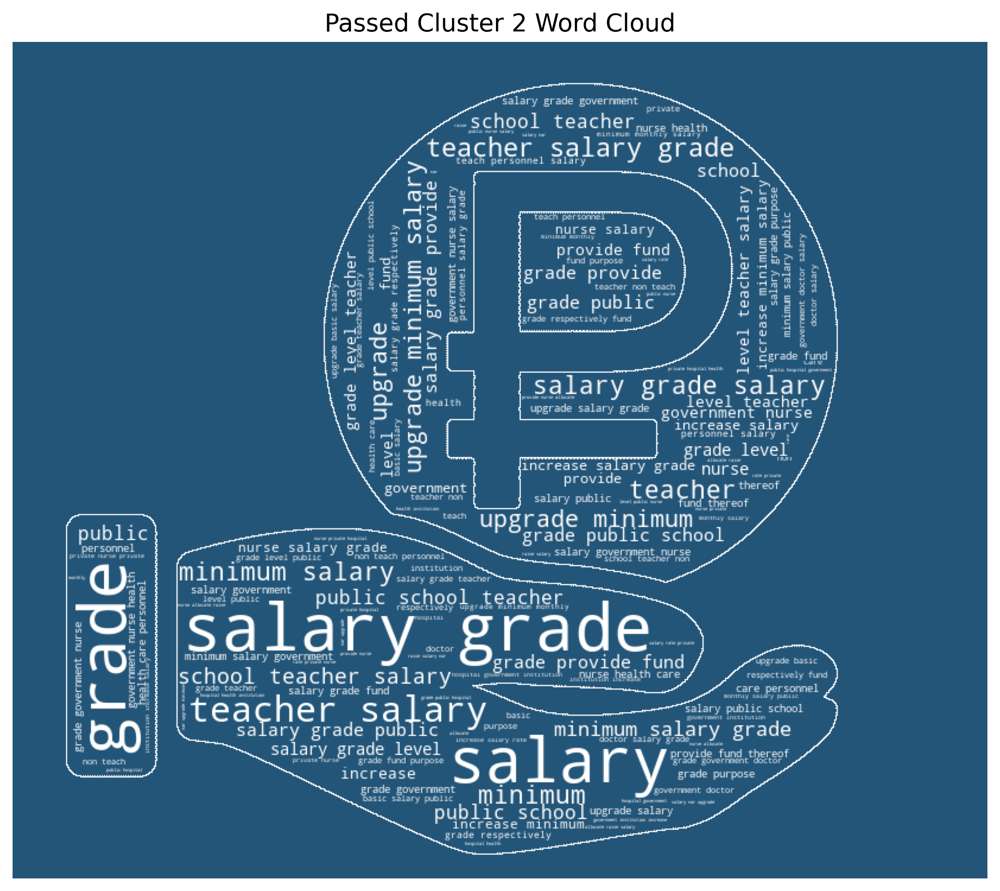

In [26]:
# plot the word cloud for cluster 2
idx_c2 = df_passed[df_passed.cluster_label == 2].index
drop_c2 = ['grade salary', 'grade salary grade']
ser_c2 = (pd.DataFrame(bow_cong_p.todense(),
                       columns=cols_p,
                       index=df_passed.index)
          .loc[idx_c2, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c2, axis=0))
mask_salary = Image.open('salary.jpg')
mask_salary = np.array(mask_salary.convert('1'))
transformed_mask = np.ndarray((mask_salary.shape[0], mask_salary.shape[1]),
                              np.int32)
for i in range(len(mask_salary)):
    transformed_mask[i] = list(map(transform_format, mask_salary[i]))
wordcloud_plotting(ser_c2,
                   ListedColormap(['white']),
                   'Passed Cluster 2 Word Cloud', mask=transformed_mask)

In [27]:
# generate list of first ten bills under this cluster
for i in df_passed.loc[idx_c2, 'title'].values[: 10]:
    print(f'{i}\n')

AN ACT UPGRADING THE MINIMUM MONTHLY SALARY OF PUBLIC SCHOOL TEACHERS AND NON-TEACHING PERSONNEL FROM SALARY GRADE 11 TO SALARY GRADE 20, AND FROM SALARY GRADE 1 TO SALARY GRADE 8, RESPECTIVELY, AND APPROPRIATING FUNDS THEREFOR

AN ACT INCREASING THE SALARY GRADE OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO 20 AND PROVIDING FUNDS THEREOF

AN ACT UPGRADING THE MINIMUM SALARY GRADE OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO SALARY GRADE 15

AN ACT UPGRADING THE MINIMUM SALARY GRADE LEVEL OF TEACHERS FROM SALARY GRADE 11 TO SALARY GRADE 19

AN ACT INCREASING THE MINIMUM SALARY GRADE OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO 20 AND PROVIDING FUNDS THEREFOR

AN ACT INCREASING THE MINIMUM SALARY OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO SALARY GRADE 15

AN ACT UPGRADING THE MINIMUM SALARY GRADE OF GOVERNMENT DOCTORS FROM SALARY GRADE 16 TO 24

AN ACT UPGRADING THE MINIMUM SALARY GRADE LEVEL OF TEACHERS FROM SALARY GRADE 11 TO 19

AN ACT UPGRADING THE SALARY GRADE 

A specific agenda of the President was to increase the salaries of public servants, including teachers. This was supposed to be advantageous for teachers under the Salary Satandadization Law, but it appears that specific bills were required to upgrade their salaries between different grades. While this has been fulfilled, it appears that it remains insufficient.

#### Cluster 3: Franchise

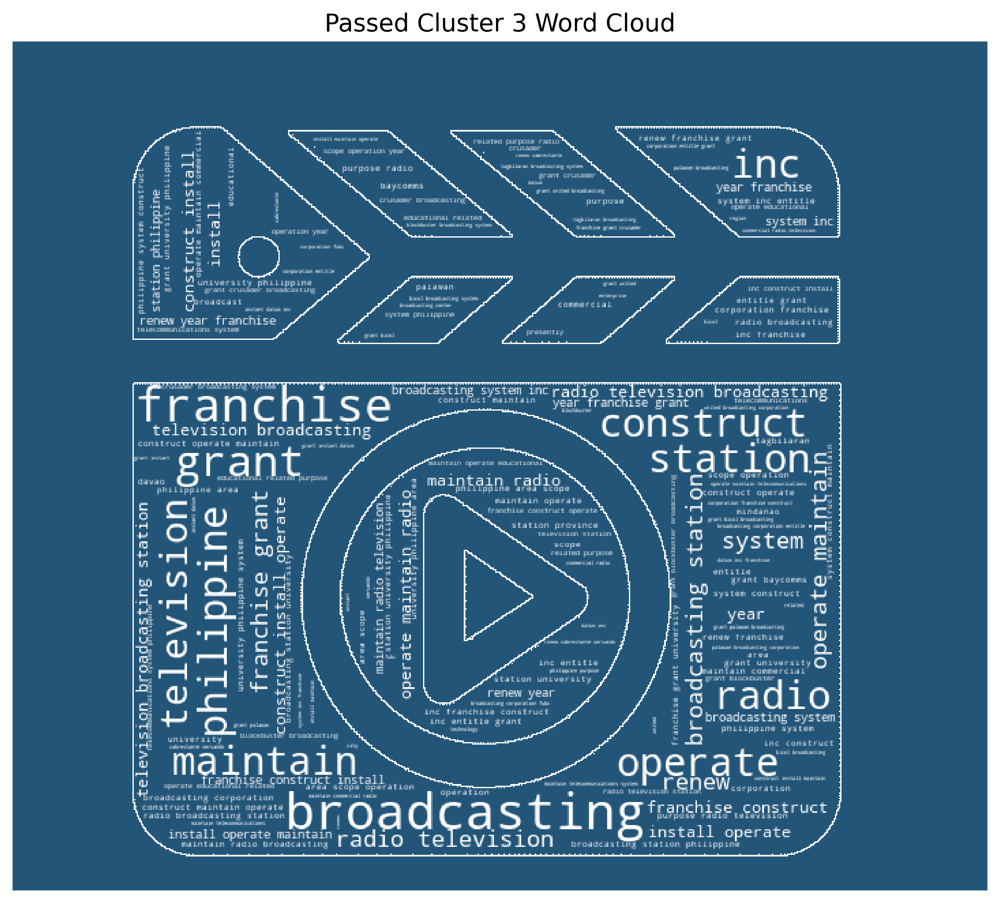

In [28]:
# plot the word cloud for cluster 3
idx_c3 = df_passed[df_passed.cluster_label == 3].index
drop_c3 = ['high']
ser_c3 = (pd.DataFrame(bow_cong_p.todense(),
                       columns=cols_p,
                       index=df_passed.index)
          .loc[idx_c3, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c3, axis=0))

mask_broad = Image.open('broadcast.jpg')
mask_broad = np.array(mask_broad.convert('1'))
transformed_mask = np.ndarray((mask_broad.shape[0], mask_broad.shape[1]),
                              np.int32)
for i in range(len(mask_broad)):
    transformed_mask[i] = list(map(transform_format, mask_broad[i]))
wordcloud_plotting(ser_c3,
                   ListedColormap(['white']),
                   'Passed Cluster 3 Word Cloud', mask=transformed_mask)

In [29]:
# generate list of first ten bills under this cluster
for i in df_passed.loc[idx_c3, 'title'].values[: 10]:
    print(f'{i}\n')

AN ACT RENEWING THE FRANCHISE GRANTED TO CRUSADERS BROADCASTING SYSTEM, INC. UNDER REPUBLIC ACT NO. 8091

AN ACT RENEWING THE FRANCHISE GRANTED TO BICOL BROADCASTING SYSTEMS, INC. (UNDER REPUBLIC ACT         NO. 8092 ENTITLED ꞌAN ACT GRANTING THE BICOL BROADCASTING SYSTEMS, INC. (BBSI) A FRANCHISE TO ESTABLISH, OPERATE AND MAINTAIN COMMERCIAL RADIO AND TELEVISION BROADCASTING STATIONS IN REGION Vꞌ) − FOR ANOTHER TWENTY-FIVE (25) YEARS FROM THE EFFECTIVITY OF THIS ACT

AN ACT RENEWING THE FRANCHISE GRANTED TO GOLD LABEL BROADCASTING SYSTEM, INC. UNDER REPUBLIC ACT NO. 8087 ENTITLED ꞌAN ACT GRANTING TO THE GOLD LABEL BROADCASTING SYSTEM, INC. A FRANCHISE TO ESTABLISH, MAINTAIN AND OPERATE RADIO AND TELEVISION BROADCASTING STATIONS IN DUMAGUETE AND OTHER AREAS IN THE VISAYAS AND MINDANAO WHERE FREQUENCIES AND/OR CHANNELS ARE STILL AVAILABLE FOR RADIO AND TELEVISION BROADCASTING FOR ANOTHER TWENTY-FIVE (25) YEARS FROM THE EFFECTIVITY OF THIS ACTꞌ

AN ACT RENEWING FOR ANOTHER TWENTY-FIVE (2

The above bills that passed into law is proof of Congress' work that it continues to review franchises and approve them, as part of their Constitutional mandate. However, none of these bills concern ABS-CBN, despite increasing calls for its approval.

#### Cluster 4: General Public Service

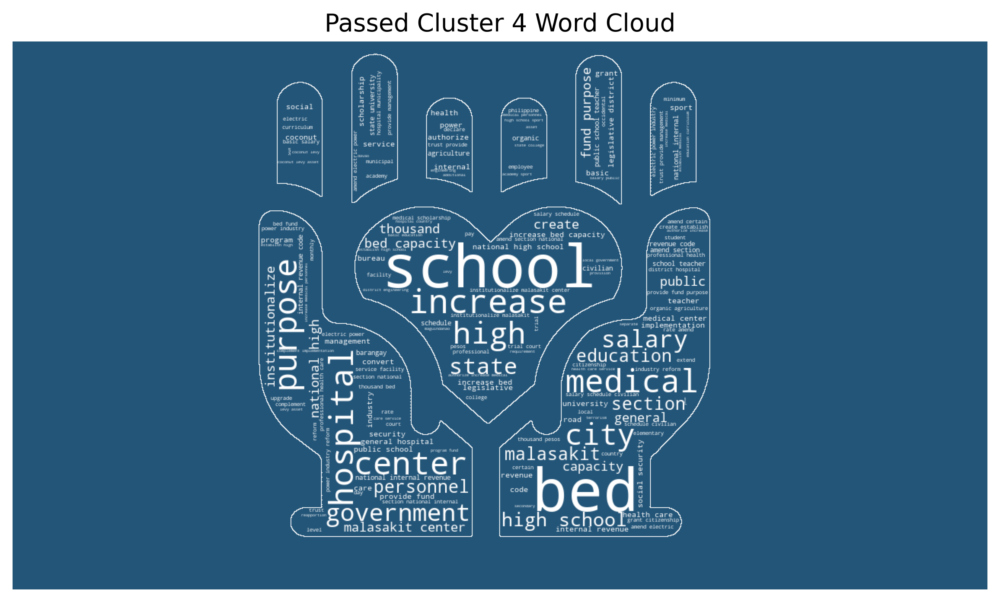

In [30]:
# plot the word cloud for cluster 4
idx_c4 = df_passed[df_passed.cluster_label == 4].index
drop_c4 = ['amend', 'national', 'fund', 'establish',
           'district', 'provide', 'province', 'municipality']
ser_c4 = (pd.DataFrame(bow_cong_p.todense(),
                       columns=cols_p,
                       index=df_passed.index)
          .loc[idx_c4, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c4, axis=0))
mask_gen = Image.open('gen.png')
mask_gen = np.array(mask_gen.convert('1'))
transformed_mask = np.ndarray((mask_gen.shape[0], mask_gen.shape[1]),
                              np.int32)
for i in range(len(mask_gen)):
    transformed_mask[i] = list(map(transform_format, mask_gen[i]))
wordcloud_plotting(ser_c4,
                   ListedColormap(['white']),
                   'Passed Cluster 4 Word Cloud', mask=transformed_mask)

In [31]:
# generate list of first ten bills under this cluster
for i in df_passed.loc[idx_c4, 'title'].values[: 10]:
    print(f'{i}\n')

AN ACT INSTITUTIONALIZING A NATIONAL VALUES, ETIQUETTE, AND MORAL UPRIGHTNESS PROGRAM

AN ACT PROVIDING FOR ADDITIONAL SUPPORT AND COMPENSATION FOR EDUCATORS IN BASIC EDUCATION

AN ACT DECLARING THE COCONUT LEVY ASSETS AS A TRUST FUND, PROVIDING FOR ITS MANAGEMENT AND UTILIZATION, AUTHORIZING THE PRIVATIZATION AND MANAGEMENT OFFICE TO DISPOSE THE COCONUT LEVY ASSETS, AND FOR OTHER PURPOSES

AN ACT ESTABLISHING THE COCONUT FARMERS AND INDUSTRY DEVELOPMENT TRUST FUND AND PROVIDING FOR ITS MANAGEMENT AND UTILIZATION

AN ACT AMENDING SECTIONS 4, 5, 20, 22, 27, 28, 34, 40, 50, 73, 112, 117, 204, 222, 237, 237-A, 255, 256, 257, 258, 260, 261, 262, 263, 264, 265, 266, 275, 288, 290 AND ADDING SECTIONS 6-A, 282-A, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 301-A, 301-B, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, AND 314 UNDER THE NATIONAL INTERNAL REVENUE CODE OF 1997, AS AMENDED, AND FOR OTHER PURPOSES

AN ACT AMENDING SECTIONS 141, 142 AND 143 OF REPUBLIC ACT NO.

## Comparision of Bills Passed Before and During the COVID-19 Pandemic
Below, we provide a comparison of the bills that passed before and during the pandemic to understand the changing priorities of Congress during a national emergency. 

In [32]:
# convert string to datetime
df_passed['date_filed'] = pd.to_datetime(df_passed['date_filed'])

### Clusters of Themes of Bills Passed Before the Pandemic

After cleaning and vectorizing the titles of bills that were not passed into law, the resulting matrix has 324 columns. To preserve 90% of the information, a total of 171 SVs were used after latent semantic analysis. Transformation of the matrix was then done.

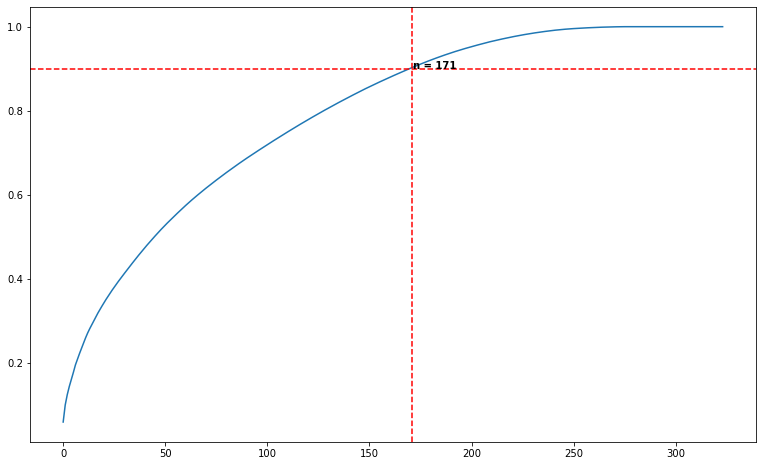

In [33]:
# filter bills passed by date filed
precovid_passed_df = df_passed[df_passed['date_filed'] <
                               pd.datetime(2020, 3, 8)].copy()

# clean text data
df_precovid_titles = precovid_passed_df[['title']]
cleaned_titles_precovid = cleaned_titles(df_precovid_titles)[['stemmed_text']]

# vectorize
bow_cong_precov, cols_precov = tfidf_converter(
    cleaned_titles_precovid['stemmed_text'].values
)
nonzeros = bow_cong_precov.sum(axis=1).nonzero()[0]
bow_cong_precov = bow_cong_precov[nonzeros]

# plot variance explained
pc = plot_var_explained(bow_cong_precov.todense(), 0.9)

# generate truncated dataframe with the SVs
tsvd_test_precov = TruncatedSVD(n_components=171)
X_cong_precov_new = tsvd_test_precov.fit_transform(bow_cong_precov.todense())

Through Agglomerative Clustering, we set the threshold at 2.41, generating thirteen (13) clusters. Presented in this report are the top 5 clusters.

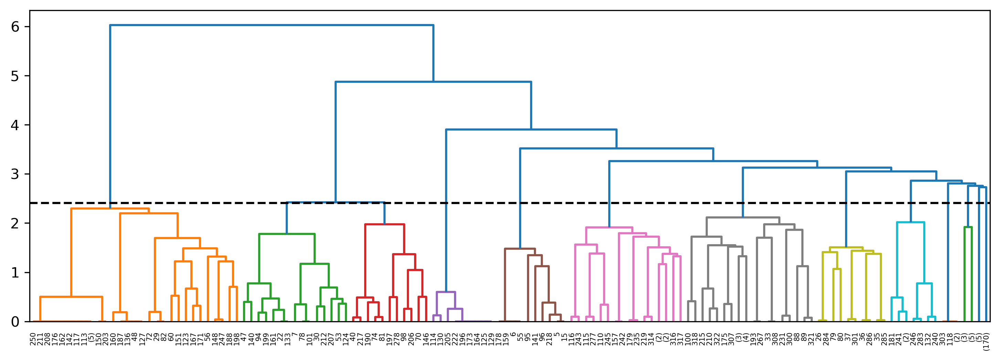

In [35]:
# determine the clusters
t_precov = plot_dendrogram(X_cong_precov_new, method='ward', p=10, thresh=2.41)

Below is an initial attempt to visualize the clusters using two singular values. As can be seen, the clusters appeared to be not compact.

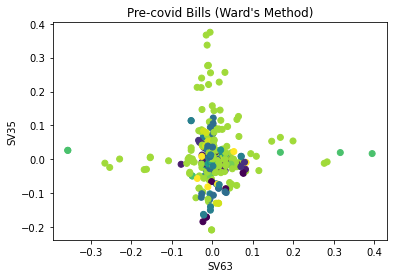

In [37]:
# visualize the clusters
y_pred_precov = plot_fcluster(X_cong_precov_new, t_precov, 62, 34,
                              'Pre-covid Bills (Ward\'s Method)')

# add cluster labels to dataframe
precovid_passed_df['cluster_label'] = y_pred_precov

Cluster 13 had the most number of bills. The rest of the clusters had lower than 40 bills.

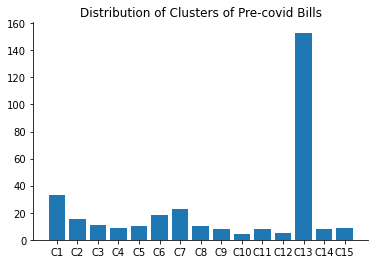

In [38]:
# visualize the clusters
fig, ax = plt.subplots()
ax.bar(x=[f'C{i}' for i in precovid_passed_df['cluster_label']
          .value_counts().sort_index().index],
       height=precovid_passed_df['cluster_label'].value_counts().sort_index())
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.title('Distribution of Clusters of Pre-covid Bills')
plt.show()

#### Cluster 1: SK Elections

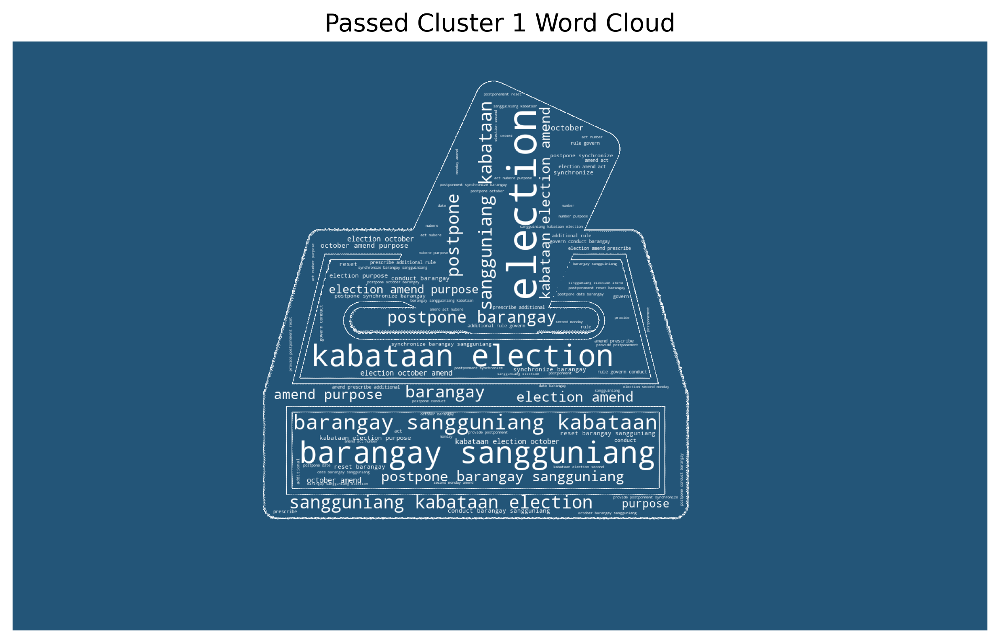

In [53]:
# plot the word cloud for cluster 1
idx_c1 = precovid_passed_df[precovid_passed_df.cluster_label == 1].index
drop_c1 = ['amend', 'sangguniang', 'kabataan']
ser_c1 = (pd.DataFrame(bow_cong_precov.todense(),
                       columns=cols_precov,
                       index=precovid_passed_df.index)
          .loc[idx_c1, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c1, axis=0))

mask_elec = Image.open('election.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
# display(mask_elec)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c1,
                   ListedColormap(['white']),
                   'Passed Cluster 1 Word Cloud', mask=transformed_mask)

In [54]:
# generate list of first ten bills under this cluster
for i in precovid_passed_df.loc[idx_c1, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 9164, AS AMENDED, AND FOR OTHER PURPOSES

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 10952, AS AMENDED BY REPUBLIC ACT NO. 9164, REPUBLIC ACT NO. 9340, REPUBLIC ACT NO. 10632, REPUBLIC ACT NO. 10656 AND REPUBLIC ACT NO. 10923, AND FOR OTHER PURPOSES

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 9164, AS AMENDED BY REPUBLIC ACT NO. 9340, REPUBLIC ACT NO. 10656, REPUBLIC ACT NO. 10923 AND REPUBLIC ACT 10952, AND FOR OTHER PURPOSES

AN ACT POSTPONING THE MAY 2020 BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 9164, AS AMENDED BY REPUBLIC ACT NO. 9340 AND REPUBLIC ACT NO. 10656, PRESCRIBING ADDITIONAL RULES GOVERNING THE CONDUCT OF BARANGAY AND SANGGUNIANG KABATAAN ELECTIONS AND FOR OTHER 

As expected, SK Elections emerged as this is one of the priorities of the President.

#### Cluster 2: Teachers' Salary Increases

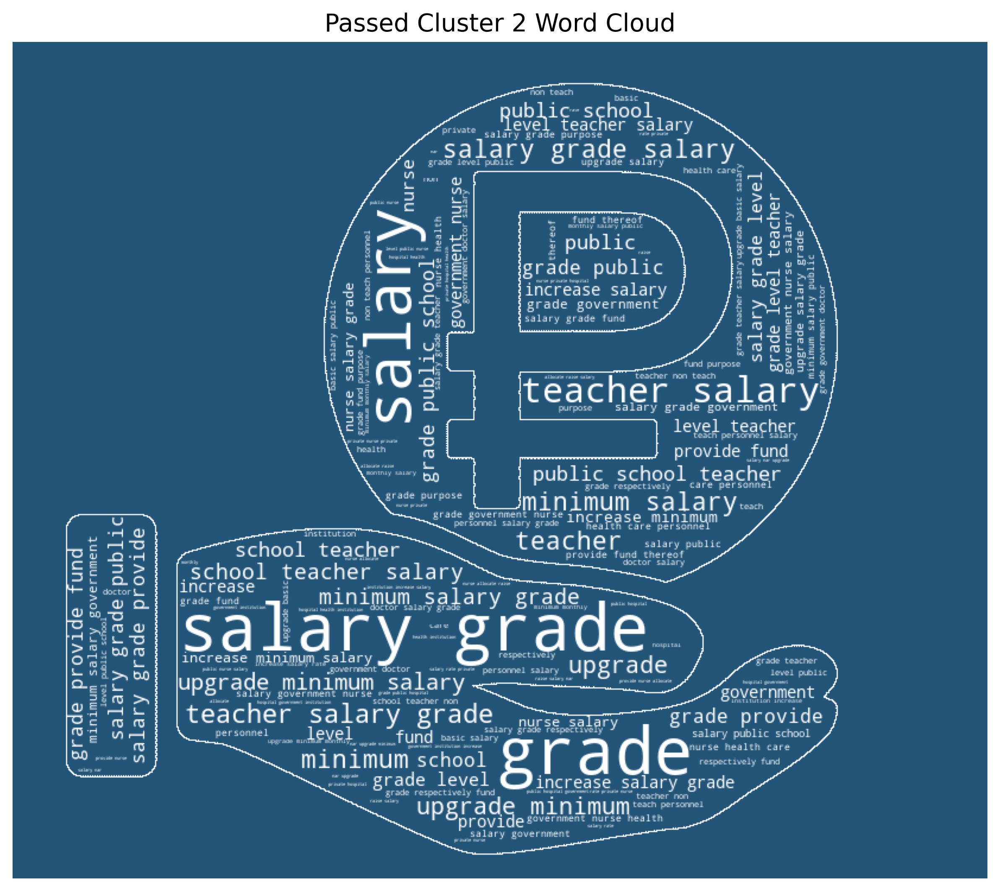

In [41]:
# plot the word cloud for cluster 2
idx_c2 = precovid_passed_df[precovid_passed_df.cluster_label == 2].index
drop_c2 = ['salary grade salary', 'grade salary', 'grade salary grade',
           'grade public',
           'grade public school', 'salary grade level',
           'salary', 'grade']
ser_c2 = (pd.DataFrame(bow_cong_precov.todense(),
                       columns=cols_precov,
                       index=precovid_passed_df.index)
          .loc[idx_c2, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c2, axis=0))

mask_elec = Image.open('salary.jpg')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
# display(mask_elec)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c2,
                   ListedColormap(['white']),
                   'Passed Cluster 2 Word Cloud', mask=transformed_mask)

In [42]:
# generate list of first ten bills under this cluster
for i in precovid_passed_df.loc[idx_c2, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT UPGRADING THE MINIMUM MONTHLY SALARY OF PUBLIC SCHOOL TEACHERS AND NON-TEACHING PERSONNEL FROM SALARY GRADE 11 TO SALARY GRADE 20, AND FROM SALARY GRADE 1 TO SALARY GRADE 8, RESPECTIVELY, AND APPROPRIATING FUNDS THEREFOR

AN ACT INCREASING THE SALARY GRADE OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO 20 AND PROVIDING FUNDS THEREOF

AN ACT UPGRADING THE MINIMUM SALARY GRADE OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO SALARY GRADE 15

AN ACT UPGRADING THE MINIMUM SALARY GRADE LEVEL OF TEACHERS FROM SALARY GRADE 11 TO SALARY GRADE 19

AN ACT INCREASING THE MINIMUM SALARY GRADE OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO 20 AND PROVIDING FUNDS THEREFOR

AN ACT INCREASING THE MINIMUM SALARY OF PUBLIC SCHOOL TEACHERS FROM SALARY GRADE 11 TO SALARY GRADE 15

AN ACT UPGRADING THE MINIMUM SALARY GRADE OF GOVERNMENT DOCTORS FROM SALARY GRADE 16 TO 24

AN ACT UPGRADING THE MINIMUM SALARY GRADE LEVEL OF TEACHERS FROM SALARY GRADE 11 TO 19

AN ACT UPGRADING THE SALARY GRADE 

As expected, salary increases of teachers also emerged given that it is a Presidential priority.

#### Cluster 3: Hospital Bed Capacity Increases

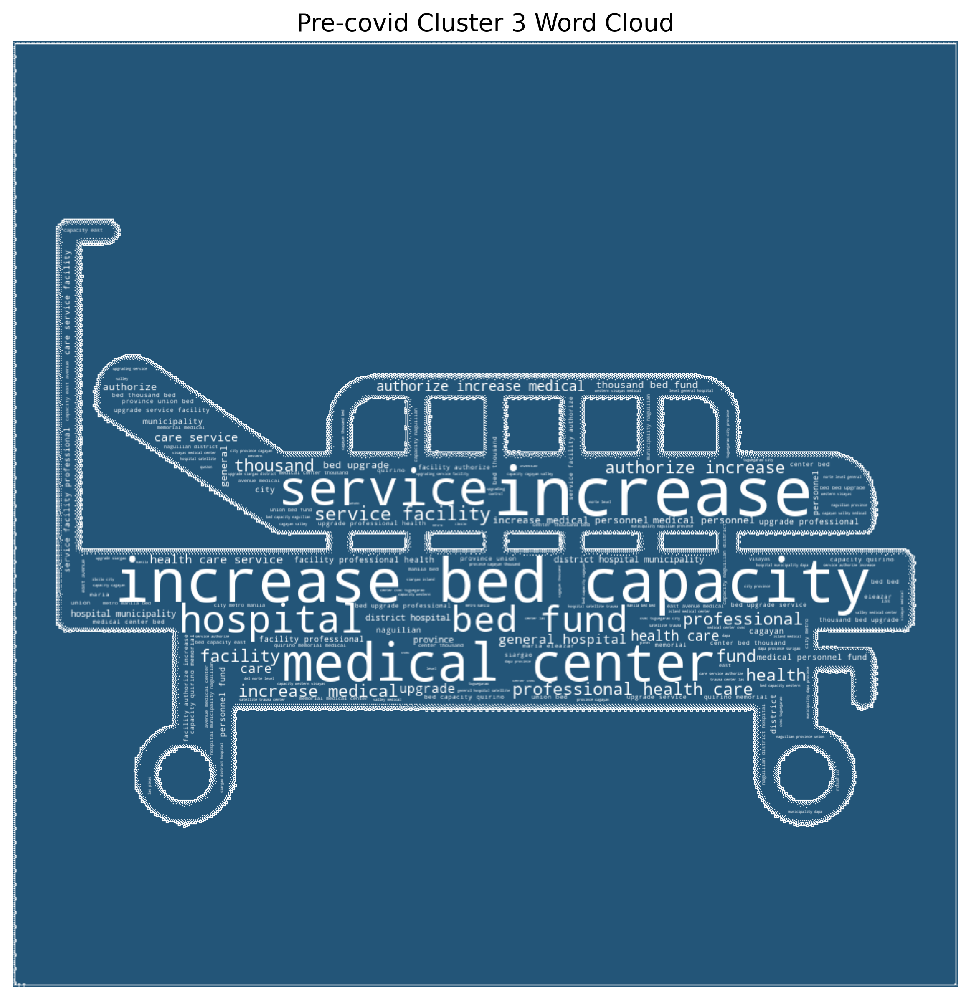

In [55]:
# plot the word cloud for cluster 3
idx_c3 = precovid_passed_df[precovid_passed_df.cluster_label == 7].index
drop_c3 = ['increase bed', 'bed', 'bed capacity', 'thousand bed',
           'capacity', 'medical', 'center', 'professional health']
ser_c3 = (pd.DataFrame(bow_cong_precov.todense(),
                       columns=cols_precov,
                       index=precovid_passed_df.index)
          .loc[idx_c3, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c3, axis=0))

mask_elec = Image.open('hospital_bed.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
# display(mask_elec)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c3,
                   ListedColormap(['white']),
                   'Pre-covid Cluster 3 Word Cloud', mask=transformed_mask)

In [56]:
# generate list of first ten bills under this cluster
for i in precovid_passed_df.loc[idx_c3, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT INCREASING THE BED CAPACITY OF THE CAGAYAN VALLEY MEDICAL CENTER (CVMC) IN TUGUEGARAO CITY, PROVINCE OF CAGAYAN, FROM FIVE HUNDRED (500) TO ONE THOUSAND (1,000) BEDS AND APPROPRIATING FUNDS THEREFOR

AN ACT INCREASING THE BED CAPACITY OF BICOL MEDICAL CENTER FROM FIVE HUNDRED (500) BEDS TO ONE THOUSAND (1000) BEDS, UPGRADING ITS SERVICE FACILITIES AND PROFESSIONAL HEALTH CARE SERVICES, AUTHORIZING THE INCREASE OF ITS MEDICAL WORKFORCE COMPLEMENT, AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 8053, AND APPROPRIATING FUNDS THEREFOR

AN ACT INCREASING THE BED CAPACITY OF WESTERN VISAYAS MEDICAL   
CENTER IN MANDURIAO, ILOILO CITY FROM FOUR HUNDRED TWENTY-FIVE (425) TO SEVEN HUNDRED (700), AUTHORIZING THE INCREASE OF ITS MEDICAL PERSONNEL, UPGRADING ITS SERVICES, FACILITIES AND PROFESSIONAL  HEALTH CARE AND APPROPRIATING FUNDS THEREFOR

AN ACT CONVERTING THE SCHISTOSOMIASIS CONTROL AND RESEARCH HOSPITAL IN PALO, LEYTE INTO A GENERAL HOSPITAL TO BE KNOWN AS THE GOVERNOR BENJAMIN T. ROMUA

This cluster is the only cluster that is neither a Presidential priority nor a Constitutional mandate. It serves as proof of Congress' focus on improving our healthcare system by increasing the bed capacities of hospitals across the country, which includes the provision of additional funds for its operations. Unfortunately, increasing bed capacity may be insufficient without the increase in the number of healthcare workers, which did not emerge in this or any other cluster.

#### Cluster 4: Franchise

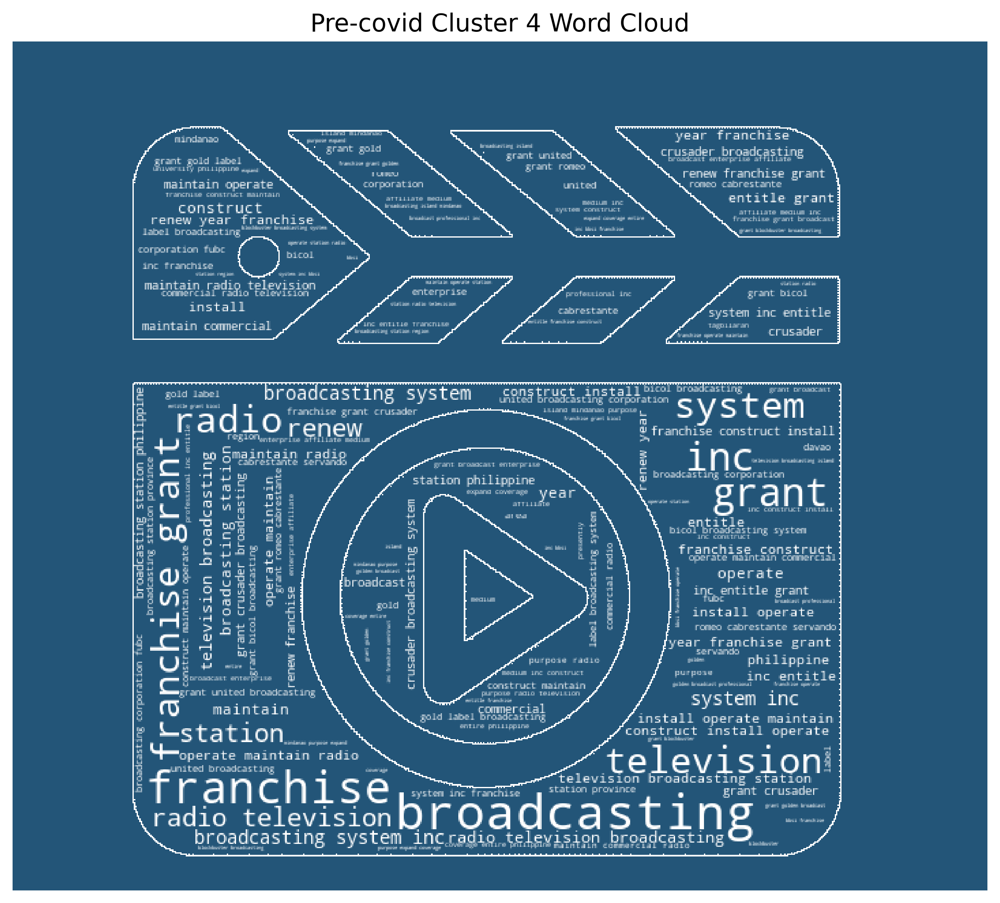

In [59]:
# plot the word cloud for cluster 4
idx_c4 = precovid_passed_df[precovid_passed_df.cluster_label == 6].index
drop_c4 = []
ser_c4 = (pd.DataFrame(bow_cong_precov.todense(),
                       columns=cols_precov,
                       index=precovid_passed_df.index)
          .loc[idx_c4, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c4, axis=0))

mask_elec = Image.open('broadcast.jpg')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
# display(mask_elec)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c4,
                   ListedColormap(['white']),
                   'Pre-covid Cluster 4 Word Cloud', mask=transformed_mask)

In [58]:
# generate list of first ten bills under this cluster
for i in precovid_passed_df.loc[idx_c4, 'title'].values[: 10].tolist():
    print(f'{i}\n')


AN ACT RENEWING THE FRANCHISE GRANTED TO CRUSADERS BROADCASTING SYSTEM, INC. UNDER REPUBLIC ACT NO. 8091

AN ACT RENEWING THE FRANCHISE GRANTED TO BICOL BROADCASTING SYSTEMS, INC. (UNDER REPUBLIC ACT         NO. 8092 ENTITLED ꞌAN ACT GRANTING THE BICOL BROADCASTING SYSTEMS, INC. (BBSI) A FRANCHISE TO ESTABLISH, OPERATE AND MAINTAIN COMMERCIAL RADIO AND TELEVISION BROADCASTING STATIONS IN REGION Vꞌ) − FOR ANOTHER TWENTY-FIVE (25) YEARS FROM THE EFFECTIVITY OF THIS ACT

AN ACT RENEWING THE FRANCHISE GRANTED TO GOLD LABEL BROADCASTING SYSTEM, INC. UNDER REPUBLIC ACT NO. 8087 ENTITLED ꞌAN ACT GRANTING TO THE GOLD LABEL BROADCASTING SYSTEM, INC. A FRANCHISE TO ESTABLISH, MAINTAIN AND OPERATE RADIO AND TELEVISION BROADCASTING STATIONS IN DUMAGUETE AND OTHER AREAS IN THE VISAYAS AND MINDANAO WHERE FREQUENCIES AND/OR CHANNELS ARE STILL AVAILABLE FOR RADIO AND TELEVISION BROADCASTING FOR ANOTHER TWENTY-FIVE (25) YEARS FROM THE EFFECTIVITY OF THIS ACTꞌ

AN ACT RENEWING FOR ANOTHER TWENTY-FIVE (2

Again, this is an expected cluster to emerge given that this is a Congressional mandate.

#### Cluster 5: Public School Education

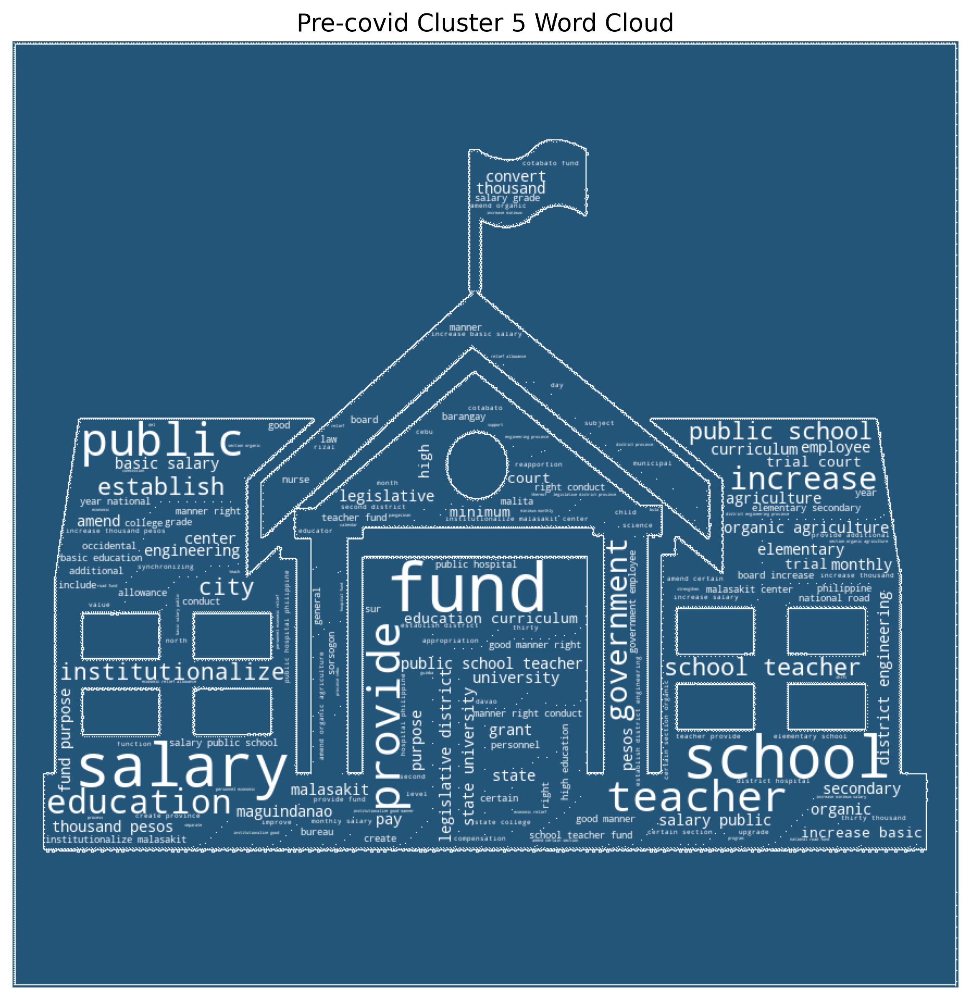

In [60]:
# plot the word cloud for cluster 5
idx_c5 = precovid_passed_df[precovid_passed_df.cluster_label == 13].index
drop_c5 = ['medical', 'road', 'province', 'municipality', 'national',
           'hospital', 'basic', 'district']
ser_c5 = (pd.DataFrame(bow_cong_precov.todense(),
                       columns=cols_precov,
                       index=precovid_passed_df.index)
          .loc[idx_c5, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c5, axis=0))

mask_elec = Image.open('school.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
# display(mask_elec)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c5,
                   ListedColormap(['white']),
                   'Pre-covid Cluster 5 Word Cloud', mask=transformed_mask)

In [61]:
# generate list of first ten bills under this cluster
for i in precovid_passed_df.loc[idx_c5, 'title'].values[: 10].tolist():
    print(i)

AN ACT INSTITUTIONALIZING A NATIONAL VALUES, ETIQUETTE, AND MORAL UPRIGHTNESS PROGRAM
AN ACT PROVIDING FOR ADDITIONAL SUPPORT AND COMPENSATION FOR EDUCATORS IN BASIC EDUCATION
AN ACT PROVIDING FOR THE REAPPORTIONMENT OF THE PROVINCE OF BATAAN INTO THREE (3) LEGISLATIVE DISTRICTS
AN ACT INCREASING THE MINIMUM SALARIES OF PUBLIC SCHOOL TEACHERS AND OTHER GOVERNMENT EMPLOYEES AND AUGMENTING THE PERSONNEL ECONOMIC RELIEF ALLOWANCE
AN ACT ESTABLISHING THE NATIONAL MINIMUM MONTHLY SALARY IN GOVERNMENT AND PROVIDING FUNDS THEREFOR
AN ACT CONVERTING THE OCCIDENTAL MINDORO STATE COLLEGE IN THE PROVINCE OF OCCIDENTAL MINDORO INTO A STATE UNIVERSITY TO BE KNOWN AS THE OCCIDENTAL MINDORO STATE UNIVERSITY (OMSU) AND APPROPRIATING FUNDS THEREFOR
AN ACT CONVERTING THE GUIMBA–TALUGTUG–UMINGAN PROVINCIAL ROAD IN THE MUNICIPALITIES OF GUIMBA AND TALUGTUG, ALL IN THE PROVINCE OF NUEVA ECIJA, AND THE MUNICIPALITY OF UMINGAN, PROVINCE OF PANGASINAN INTO A NATIONAL ROAD AND APPROPRIATING FUNDS THEREFOR
AN A

Finally, this cluster relating to public school education - with some bills focusing on other areas, such as roads - have surfaced. This is a Congressional mandate.

### Clusters of Themes of Bills Passed During the Pandemic


After cleaning and vectorizing the titles of bills that were not passed into law, the resulting matrix has 1,833 columns. To preserve 90% of the information, a total of 59 SVs were used after latent semantic analysis. Transformation of the matrix was then done.1833

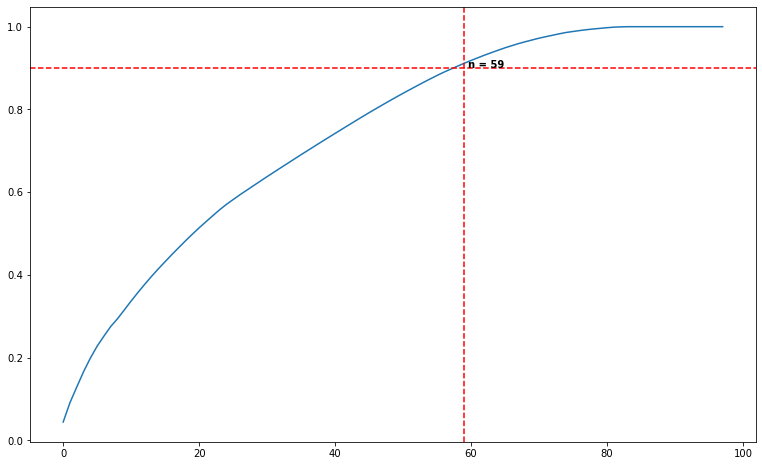

In [68]:
# filter bills passed by date filed
covid_passed_df = df_passed[df_passed['date_filed']
                            >= pd.datetime(2020, 3, 8)].copy()

# clean text data
df_covid_titles = covid_passed_df[['title']]
cleaned_titles_covid = cleaned_titles(df_covid_titles)[['stemmed_text']]

# vectorize
bow_cong_cov, cols_cov = tfidf_converter(
    cleaned_titles_covid['stemmed_text'].values
)
nonzeros = bow_cong_cov.sum(axis=1).nonzero()[0]
bow_cong_cov = bow_cong_cov[nonzeros]

# plot variance explained
cov = plot_var_explained(bow_cong_cov.todense(), 0.9)

# generate truncated dataframe with the SVs
tsvd_test_cov = TruncatedSVD(n_components=59)
X_cong_cov_new = tsvd_test_cov.fit_transform(bow_cong_cov.todense())

To generate the number of clusters, we set the threshold at 2.65.

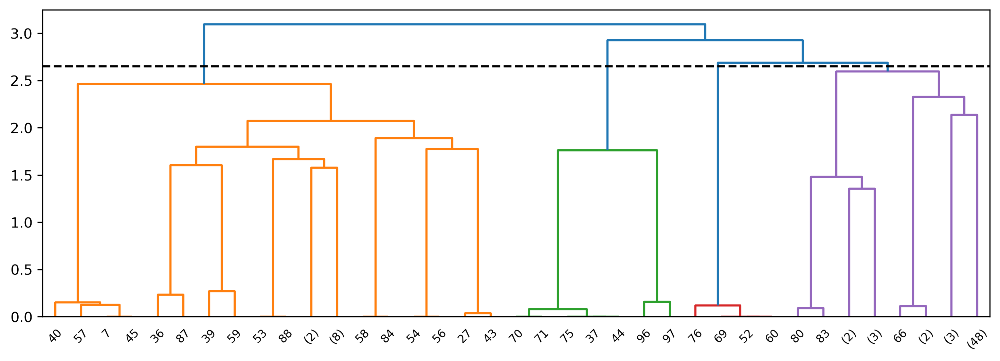

In [69]:
# determine the clusters
t_cov = plot_dendrogram(X_cong_cov_new, method='ward', p=5, thresh=2.65)

Here, we attempted to visualize the clusters using a scatterplot but the clusters were not that eveident.

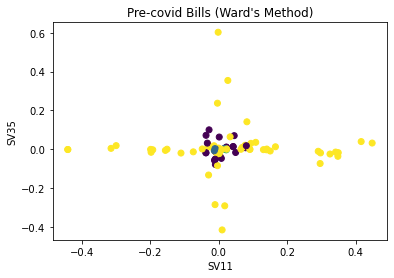

In [72]:
# visualize the clusters
y_pred_cov = plot_fcluster(X_cong_cov_new, t_cov, 10, 34,
                           'Pre-covid Bills (Ward\'s Method)')

# add cluster labels to the dataframe
covid_passed_df['cluster_label'] = y_pred_cov

Below it can be observed that most of the bills belong to cluster 4, followed by cluster 1.

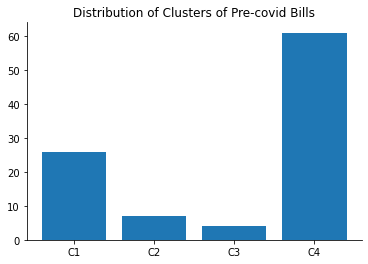

In [73]:
# visualize the clusters
fig, ax = plt.subplots()
ax.bar(x=[f'C{i}' for i in covid_passed_df['cluster_label']
          .value_counts().sort_index().index],
       height=covid_passed_df['cluster_label'].value_counts().sort_index())
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.title('Distribution of Clusters of Pre-covid Bills')
plt.show()

We present below two of the relevant clusters of bills that were passed during the pandemic. The following appears to be the priorities of Congress given the impact of the government restrictions placed across the country. 

#### Cluster 1: Franchise

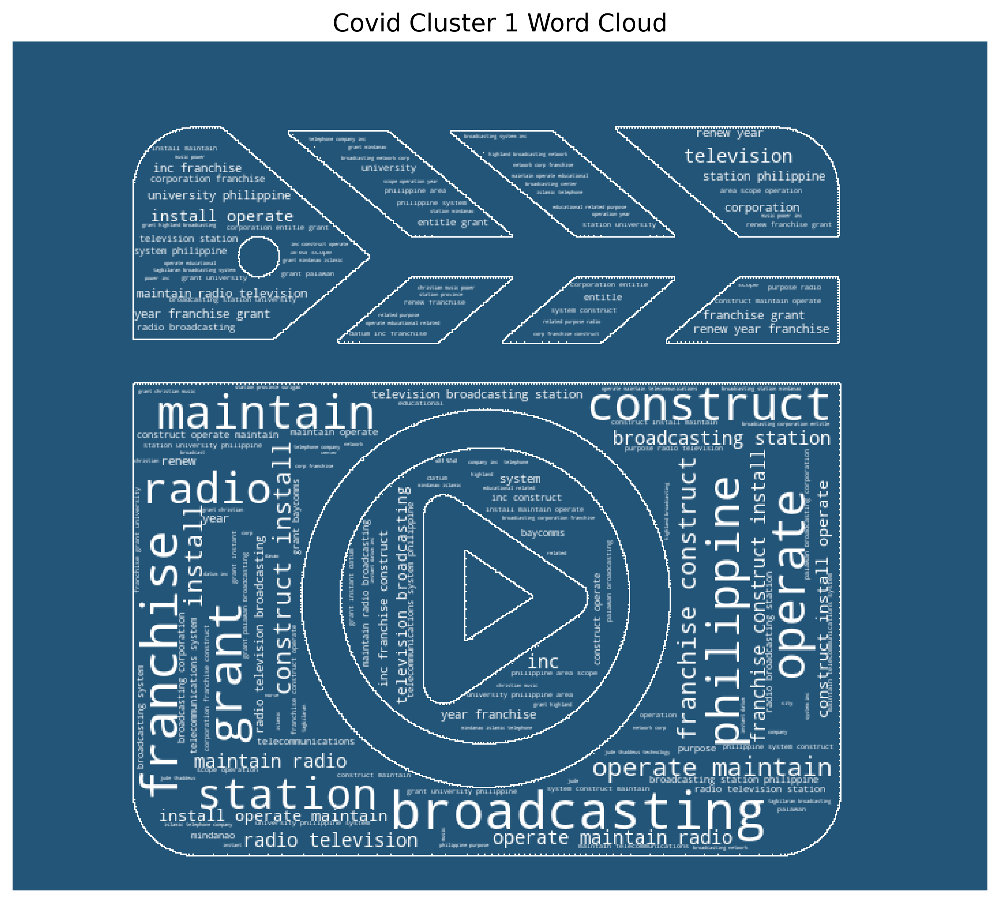

In [74]:
# plot the word cloud for cluster 1
idx_c1 = covid_passed_df[covid_passed_df.cluster_label == 1].index
drop_c1 = []
ser_c1 = (pd.DataFrame(bow_cong_cov.todense(),
                       columns=cols_cov,
                       index=covid_passed_df.index)
          .loc[idx_c1, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c1, axis=0))

mask_elec = Image.open('broadcast.jpg')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
# display(mask_elec)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c1,
                   ListedColormap(['white']),
                   'Covid Cluster 1 Word Cloud', mask=transformed_mask)

In [75]:
# generate list of first ten bills under this cluster
for i in covid_passed_df.loc[idx_c1, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT RENEWING THE FRANCHISE GRANTED TO THE UNIVERSITY OF THE
PHILIPPINES SYSTEM TO CONSTRUCT, ESTABLISH, MAINTAIN, AND OPERATE FOR EDUCATIONAL AND OTHER RELATED PURPOSES, RADIO AND TELEVISION BROADCASTING STATIONS WITHIN THE UNIVERSITY OF THE PHILIPPINES AND IN SUCH OTHER AREAS WITHIN THE SCOPE OF ITS OPERATION, UNDER REPUBLIC ACT NO. 8160, TO ANOTHER TWENTY-FIVE (25) YEARS

AN ACT RENEWING THE FRANCHISE GRANTED TO PALAWAN
BROADCASTING CORPORATION UNDER REPUBLIC ACT NO. 8060
ENTITLED "AN ACT GRANTING THE PALAWAN BROADCASTING
CORPORATION A FRANCHISE TO INSTALL, CONSTRUCT, OPERATE
AND MAINTAIN COMMERCIAL RADIO AND TELEVISION
BROADCASTING STATIONS THROUGHOUT THE PHILIPPINES" FOR
TWENTY-FIVE (25) YEARS FROM THE EFFECTIVITY OF THIS ACT

AN ACT RENEWING FOR ANOTHER TWENTY-FIVE (25) YEARS THE FRANCHISE GRANTED TO MINDANAO ISLAMIC TELEPHONE COMPANY, INC., PRESENTLY KNOWN AS DITO TELECOMMUNITY CORPORATION, AND AMENDING FOR THE PURPOSE REPUBLIC ACT NO. 8627, ENTITLED "AN ACT GRANTING THE MINDA

Franchise yet again resurfaced among the bills that passed during the pandemic. This appears to support the view that Congress continued to consider applications for franchises despite an ongoing pandemic - which may indicate that information dissemination is a key priority especially in a state of national emergency. Broadcasting stations allow the government to make itself more transparent and reach more individuals, especially during announcements on travel restrictions.

#### Cluster 2: Pandemic Response

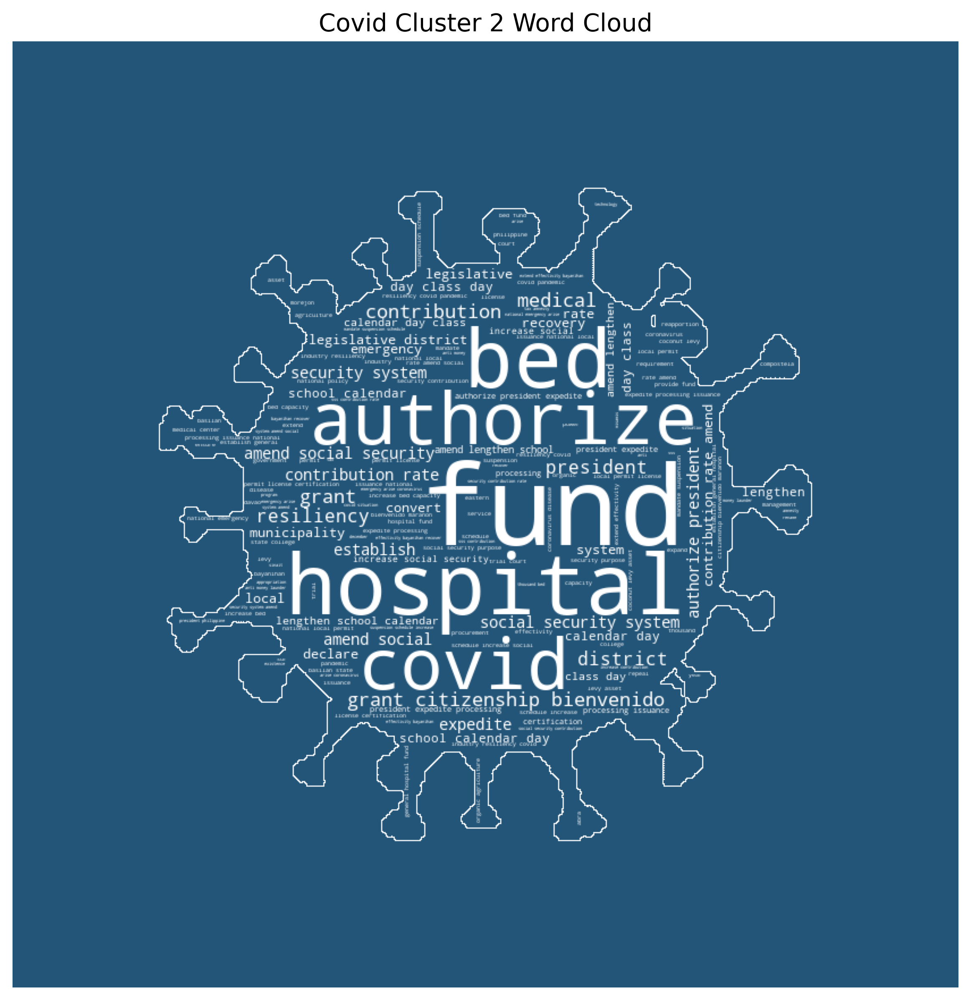

In [76]:
# plot the word cloud for cluster 1
idx_c4 = covid_passed_df[covid_passed_df.cluster_label == 4].index
drop_c4 = ['general', 'province', 'bienvenido', 'citizenship', 'state',
           'national', 'citizenship bienvenido', 'state university', 'school',
           'occidental', 'coconut', 'marañon', 'center', 'policy', 'energy',
           'class', 'calendar', 'lengthen school', 'university',
           'general hospital', 'city', 'social security', 'amend',
           'provide', 'social', 'increase', 'security', 'grant citizenship',
           'purpose', 'day']
ser_c4 = (pd.DataFrame(bow_cong_cov.todense(),
                       columns=cols_cov,
                       index=covid_passed_df.index)
          .loc[idx_c4, :]
          .sum(axis=0).sort_values(ascending=False).drop(drop_c4, axis=0))

mask_elec = Image.open('covid19.png')
mask_elec = np.array(mask_elec.convert('1'))
transformed_mask = np.ndarray((mask_elec.shape[0], mask_elec.shape[1]),
                              np.int32)
for i in range(len(mask_elec)):
    transformed_mask[i] = list(map(transform_format, mask_elec[i]))
wordcloud_plotting(ser_c4,
                   ListedColormap(['white']),
                   'Covid Cluster 2 Word Cloud', mask=transformed_mask)

In [77]:
# generate list of first ten bills under this cluster
for i in covid_passed_df.loc[idx_c4, 'title'].values[: 10].tolist():
    print(f'{i}\n')

AN ACT FURTHER EXPANDING THE JURISDICTION OF METROPOLITAN TRIAL COURTS, MUNICIPAL TRIAL COURTS IN CITIES, MUNICIPAL TRIAL COURTS, AND MUNICIPAL CIRCUIT TRIAL COURTS, AMENDING FOR THE PURPOSE BATAS PAMBANSA BLG.129, OTHERWISE KNOWN AS THE "JUDICIARY REORGANIZATION ACT OF 1980," AS AMENDED

AN ACT RENAMING THE COMPOSTELA VALLEY STATE COLLEGE IN THE MUNICIPALITY OF COMPOSTELA, PROVINCE OF COMPOSTELA VALLEY TO THE DAVAO DE ORO STATE COLLEGE

AN ACT TO DECLARE THE EXISTENCE OF A NATIONAL EMERGENCY ARISING FROM THE CORONAVIRUS 2019 (COVID-19) SITUATION AND A NATIONAL POLICY IN CONNECTION THEREWITH, AND AUTHORIZING THE PRESIDENT OF THE REPUBLIC OF THE PHILIPPINES FOR A LIMITED PERIOD AND SUBJECT TO RESTRICTIONS, TO EXERCISE POWERS NECESSARY AND PROPER TO CARRY OUT THE DECLARED NATIONAL POLICY AND FOR OTHER PURPOSES

THE PHILIPPINE BANKING INDUSTRY RESILIENCY ACT AGAINST COVID-19 PANDEMIC

AN ACT AMENDING THE HEIGHT REQUIREMENTS FOR POLICE APPLICANTS AMENDING FOR THE PURPOSE SECTION 30 OF RA 6

Finally, several bills related to the COVID-19 pandemic response is a key cluster that succinctly shows that priorities have shifted pre- and during the pandemic. Where most bills have focused on the President's priorities and improving basic services such as education and healthcare, the COVID-19 pandemic response mostly covered both economic and health-related solutions to alleviate challenges during this emergency. This is the only cluster were economic terms surfaced, at least in terms of the participation of and focus on small and large businesses (in earlier clusters, economic terms focused solely on the provision and allocation of the budget).

# Summary of Results and Conclusion

In this report, we provide evidence on the emerging themes from bills filed and passed by the House of Representatives. We have identified different clusters and have connected it to the current context within which those bills were considered and debated, with the aim of surfacing the themes that may not easily be perceived. We have observed the following:

1. **Most bills that are filed relate to Constitutional mandates that require Congressional action**. For example, the establishment of new schools, roads, or courts. <br> <br>
2. **The rest of the emerging clusters relate to President's key priorities**. This supports the view that it is the President who sets the agenda for Congress, despite them being of co-equal branches.
   - One specific cluster that emerged was Build, Build, Build. Despite some studies showing that Congressional support reduces after a few years, compliance by Congress appears to continue as shown by bill survival and high budget allotment annually.
   - Highly contentious issues before the pandemic saw high bill survival, such as the SK Election Postponement and the Salary Increase of Teachers. This is an impressive scenario and is proof of the President's popularity, even if his term is about to end in a few months' time. <br> <br>
3. **The case of ABS-CBN is a tangible example of the conflict between Congress' Constitutional mandate and the President's priorities**. Congress has continued to review and approve broadcasting and network franchises even during the pandemic, yet it has never reviewed nor passed any measures that relate to ABS-CBN's franchise. The President has been very specific in his views related to ABS-CBN, which may have greatly influenced the debates and decision-making of House representatives.

In conclusion, it appears that the bills filed under the House of Representatives relate to their compliance for Constitional mandates. Those that continue to pass into law relate to the President's key priorities, as set out during the annual SONA. We have observed no clusters that opposed any of Congress' co-equal branches - that of the President's or the Judiciary's priorities or sentiments - which may indicate respect and courtesy for the separation of powers. 

In this report, we have successfully described the different clusters of House bills during the 18th Congress. We have contextualized these clusters depending on the current events that surrounded them, most especially during the COVID-19 pandemic. We have surfaced insights that support existing research on the dynamics between the legislature and the executive. An extension of this study may be done by considering more features and understanding further the dynamics that are at play during lawmaking: for example, there may be clusters that emerge from specific parties, party lists, or dynasties.

# Recommendations

We recommend the following for the House of Representatives and civil society organizations:

1. **Holding our House representatives to account**. Knowing which themes or issues our district representatives have supported is a way to evaluate their performance. It may be useful to engage them further and influence their positions to maximize and emphasize their role as true *representatives* of the voters and citizens.

2. **Lobby relevant movements and initiatives with officials**. There are still a few months before the end of the current Congress. When individuals are aware which themes have not been popular among House representatives, civil society organizations can use this information to better target their efforts in lobbying with specific parties, party lists, or individuals.

3. **Educate ourselves and others ahead of the 2022 elections**. Knowing the track record of the district representatives that represent us will contribute to more informed voters. This will ensure that our representatives commit to their promises during and after the elections.

We recommend the following for further research:

1. **Expand the dataset to be considered**. It may be useful to expand the dataset to include profiles about each representative: their voting history, their electoral performance, and their party affiliations. This may allow researchers to surface new insights or confirm current knowledge about the changing priorities of Congress.

2. **Use lesser n-grams for further explaration**. Lesser n-grams may contribute to better visualization and appreciation of the word clouds. Unigrams by themselves may not provide sufficient context, and trigrams do not provide enough frequency for the visualizations to be useful.

# References

<a id='agpalo'>Agpalo, R.E. (1981)</a>. The Philippines: From communal to societal Pangulo regime. *Phil. LJ*, 56, 56.

<a id='house'>House of Representatives (2021)</a>. Legislative information system. *House of Representatives Website*. Retrieved from https://www.congress.gov.ph/legis/

<a id='official'>Official Gazette (2021)</a>. The legislative branch. *Official Gazette of the Philippines*. Retrieved from https://www.officialgazette.gov.ph/about/gov/the-legislative-branch/

<a id='panao'>Panao, R.A.L. (2014)</a>. Beyond roll call: Executive-legislative relations and lawmaking in the Philippine House of Representatives. *Philippine Political Science Journal*, 35(1), 59-77.

<a id='reganit'>Reganit, J.C. (2019)</a>. House posts ‘historic’ attendance record. *Philippine News Agency*. Retrieved from https://www.pna.gov.ph/articles/1083220

<a id='rose'>Rose-Ackerman, S., Desierto, D. A., & Volosin, N. (2010)</a>. Hyper-presidentialism: Separation of Powers without Checks and Balances in Argentina and the Philippines. Berkeley Journal of International Law (BJIL), *Yale Law & Economics Research Paper*, (418).

<a id='teehankee'>Teehankee, J. (2002)</a>. Electoral politics in the Philippines. *Electoral Politics in Southeast and East Asia*, 149-202.

<a id='wurfel'>Wurfel, D. (1991)</a>. *Filipino politics: Development and decay*. Cornell University Press.

<a id='yano'>Yano, T., Smith, N. A., & Wilkerson, J. (2012)</a>. Textual predictors of bill survival in congressional committees. In proceedings of the 2012 conference of the north American chapter of the Association for Computational Linguistics: human language technologies (pp. 793-802).

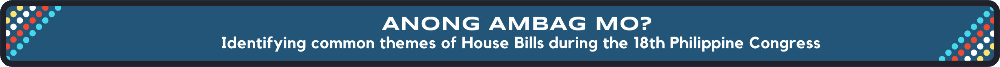